# Classify inner bulge (IB), upper HF (uHF) and outer bulge (OB) cells for subclustering

## Find genes which mark (expressed higher than in all other groups with 99.9% PP) or are uniquely expressed over Baseline in IB, uHF and OB  populations

In [19]:
#uniquely expressed over Baseline in IB population (#9)

genes_IB_unique = NBR_1st_bin_bl[NBR_1st_bin_bl['9'] == 1].index
genes_IB_unique = NBR_1st_bin_bl.ix[genes_IB_unique][NBR_1st_bin_bl.ix[genes_IB_unique].sum(axis=1)==1].index

#marker genes in IB population

genes_IB_marker = NBR_1st_bin_gr[NBR_1st_bin_gr['9'] == 1].index

#combine

genes_IB = list(set(genes_IB_unique | genes_IB_marker))

print len(genes_IB)

63


In [20]:
#uniquely expressed over Baseline in OB population (#7)

genes_OB_unique = NBR_1st_bin_bl[NBR_1st_bin_bl['7'] == 1].index
genes_OB_unique = NBR_1st_bin_bl.ix[genes_OB_unique][NBR_1st_bin_bl.ix[genes_OB_unique].sum(axis=1)==1].index

#marker genes in bulge population

genes_OB_marker = NBR_1st_bin_gr[NBR_1st_bin_gr['7'] == 1].index

#combine

genes_OB = list(set(genes_OB_unique | genes_OB_marker))

print len(genes_OB)

169


In [21]:
#uniquely expressed over baseline in upper HF populations (#6, #3, #4)

genes_uHF_unique = NBR_1st_bin_bl[NBR_1st_bin_bl[['6','3','4']].sum(axis = 1)>=1].index
col_tmp = [col for col in NBR_1st_bin_bl.columns if col not in ['6','3','4']]
genes_uHF_unique = NBR_1st_bin_bl.ix[genes_uHF_unique][NBR_1st_bin_bl.ix[genes_uHF_unique, col_tmp].sum(axis=1) == 0].index
                                                       
#marker genes in bulge population

genes_uHF_marker_1 = NBR_1st_bin_gr[NBR_1st_bin_gr['6'] == 1].index
genes_uHF_marker_2 = NBR_1st_bin_gr[NBR_1st_bin_gr['3'] == 1].index
genes_uHF_marker_3 = NBR_1st_bin_gr[NBR_1st_bin_gr['4'] == 1].index

#combine

genes_uHF = list(set(genes_uHF_unique | genes_uHF_marker_1 | genes_uHF_marker_2 | genes_uHF_marker_3))

len(genes_uHF)

128

## Select cells with IB signature among non-immune, non-SG cells

In [22]:
seq = loadData_v1(path_input, exp_id, 'seq', 'DataFrame')

In [23]:
IB_signature = pd.DataFrame(0,index=['float','bool'], columns = s_groups_1st.index)

IB_signature.ix['float'] = seq.ix[genes_IB, s_groups_1st.index].sum(axis = 0)

IB_signature.ix['bool'][IB_signature.ix['float']>=150] = 1 #set cutoff
IB_signature.ix['bool', s_groups_1st[s_groups_1st==9].index] = 1 #include all cells in the K6 cluster
IB_signature.ix['bool', s_groups_1st[s_groups_1st.isin([5,11,12])].index] = 0 #exclude immune and SG cells (if any)

IB_select = IB_signature.ix['bool'][IB_signature.ix['bool']==1].index

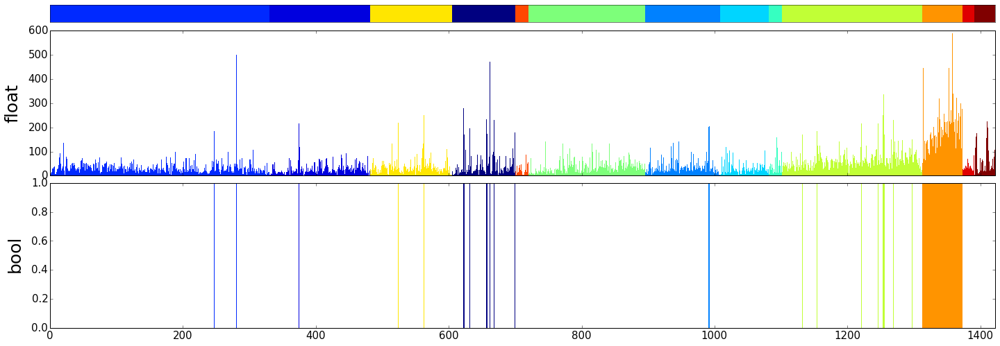

In [24]:
draw_barplots(IB_signature, s_groups_1st, ['float','bool'])

In [25]:
Counter(s_groups_1st.ix[IB_select])

Counter({0: 8, 1: 1, 2: 2, 3: 3, 7: 10, 8: 2, 9: 61})

## Select cells with OB signature among non-immune, non-SG cells

In [26]:
OB_signature = pd.DataFrame(0,index=['float','bool'], columns = s_groups_1st.index)

OB_signature.ix['float'] = seq.ix[genes_OB, s_groups_1st.index].sum(axis = 0)

OB_signature.ix['bool'][OB_signature.ix['float']>=100] = 1 #set cutoff
OB_signature.ix['bool', s_groups_1st[s_groups_1st==7].index] = 1 #select all cells in the bulge cluster
OB_signature.ix['bool', s_groups_1st[s_groups_1st.isin([5,11,12,2,1])].index] = 0 #exclude immune and SG cells (if any)*

#*since the baseline value is very high (due to Krt15 expression), set a higher treshold for #2 and #1

ix_tmp = s_groups_1st[s_groups_1st.isin([2,1])].index
ix_tmp = OB_signature.ix['bool', ix_tmp][OB_signature.ix['float', ix_tmp]>=150].index
OB_signature.ix['bool', ix_tmp] = 1

#extract

OB_select = OB_signature.ix['bool'][OB_signature.ix['bool']==1].index

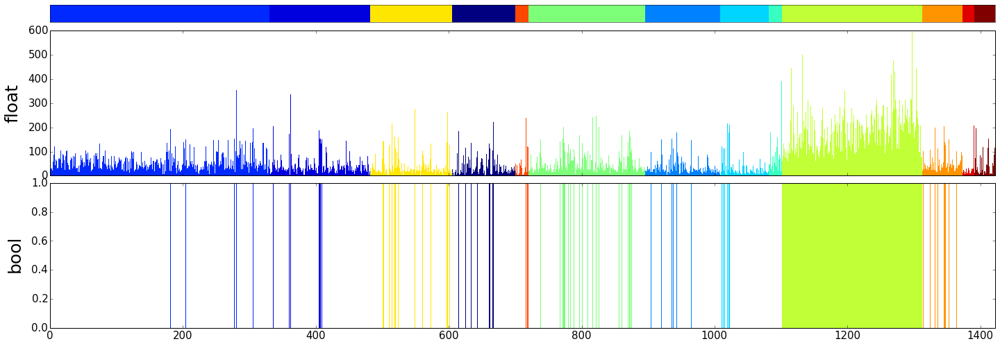

In [27]:
draw_barplots(OB_signature, s_groups_1st, ['float','bool'])

In [28]:
Counter(s_groups_1st.ix[OB_select])

Counter({0: 9, 1: 8, 2: 6, 3: 6, 4: 6, 6: 22, 7: 211, 8: 14, 9: 9, 10: 4})

## Select cells with uHF signature among non-immune, non-SG cells

In [29]:
uHF_signature = pd.DataFrame(0,index=['float','bool'], columns = s_groups_1st.index)

uHF_signature.ix['float'] = seq.ix[genes_uHF, s_groups_1st.index].sum(axis = 0)

uHF_signature.ix['bool'][uHF_signature.ix['float']>=200] = 1 #set cutoff
uHF_signature.ix['bool', s_groups_1st[s_groups_1st.isin([6,3,4])].index] = 1 #select all cells in the uHF clusters
uHF_signature.ix['bool', s_groups_1st[s_groups_1st.isin([5,11,12])].index] = 0 #exclude immune and SG cells (if any)

uHF_select = uHF_signature.ix['bool'][uHF_signature.ix['bool']==1].index

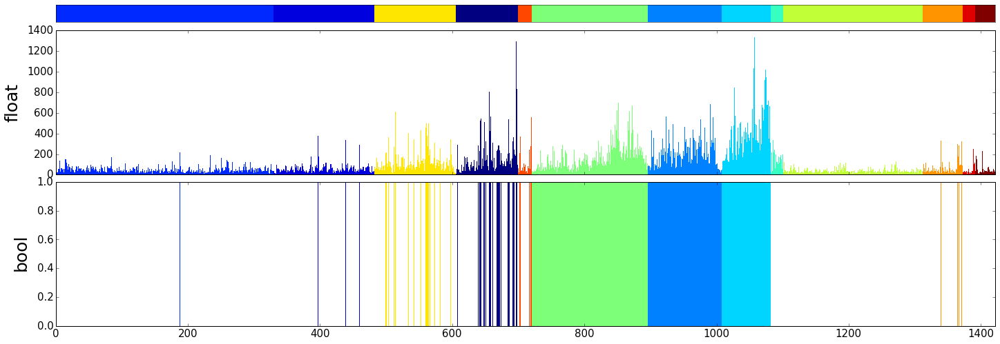

In [30]:
draw_barplots(uHF_signature, s_groups_1st, ['float','bool'])

In [31]:
Counter(s_groups_1st.ix[uHF_select])

Counter({0: 28, 1: 3, 2: 1, 3: 112, 4: 74, 6: 176, 8: 17, 9: 4, 10: 5})

## To avoid splitting-up populations of cells with multiple signatures, selects cells according to IB > OB > uHF signature

In [32]:
IB_cells = list(IB_select)

In [33]:
len(IB_cells)

87

In [34]:
OB_cells = list(set(OB_select.difference(IB_select)))

In [35]:
len(OB_cells)

273

In [36]:
uHF_cells = list(set(uHF_select.difference(IB_select|OB_select)))

In [37]:
len(uHF_cells)

364

## Use remaining non-immune and non-SG cells as IFE fraction for pseudotemporal ordering

In [38]:
IFE_select = s_groups_1st[s_groups_1st.isin([2,1,8,0,10])].index

IFE_cells = list(set(IFE_select.difference(IB_select|OB_select|uHF_select)))

In [39]:
len(IFE_cells)

630

# Subcluster IB cells

## Select features

In [87]:
seq = loadData_v1(path_input, exp_id, 'seq', 'DataFrame')

In [88]:
seq_IB = seq[IB_cells]

In [89]:
len(seq_IB.columns)

87


Dropping spikes from dataset

Dropping repeats from dataset

Dropping unexpressed genes from dataset

After mean expression cutoff of 0.1, 7771 genes remain

After correlation cutoff of 5, 7743 genes remain

Optimization terminated successfully.
         Current function value: 1801.281918
         Iterations: 32
         Function evaluations: 61

After high variance feature selection, 2500 genes remain

Calculating binary logarithm of x + 1


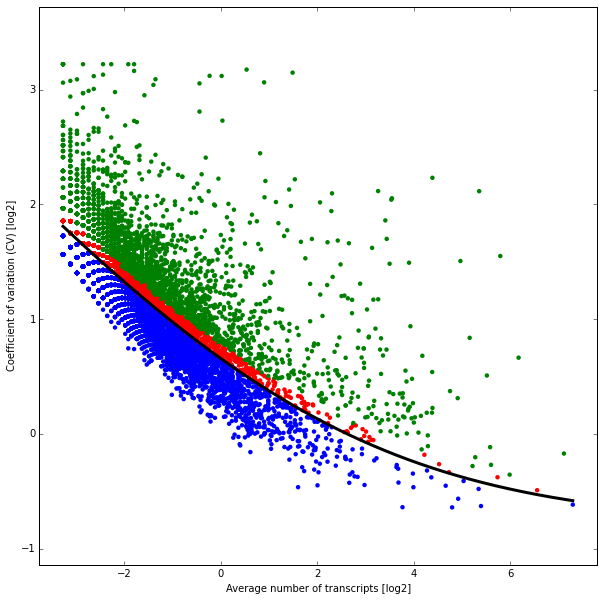

In [90]:
seq_sel_IB = select_features_v1(seq_IB, 0.10, 5, 2500, path_input, percentile=95, return_all=False)

## Remove genes which where identified as early immediate genes (#2) and housekeeping genes (#0) in the 1st lvl clustering, but include genes which have been defined as linked to the IB cluster in 1st lvl clustering

In [93]:
genes_sel = list(set(seq_sel_IB.index.difference(g_groups_1st[g_groups_1st.isin([2,0])].index)))
genes_sel = list(set(genes_sel + list(g_groups_1st[g_groups_1st==8].index)))

seq_sel_IB = log2Transform(seq_IB.ix[genes_sel])


Calculating binary logarithm of x + 1


In [94]:
len(seq_sel_IB.index)

2343

## Checkpoint

In [95]:
#saveData_v1(seq_sel_IB, path_output, exp_id, 'seq_sel_IB')

In [96]:
seq_sel_IB = loadData_v1(path_output, exp_id, 'seq_sel_IB', 'DataFrame')

## Cluster cells I

In [97]:
preference = np.arange(0.0, 0.7, 0.1)
damping = np.arange(0.5, 0.9, 0.05)

In [98]:
affy_s_IB = seq_sel_IB.corr()
dist_s_IB = 1 - affy_s_IB

           0.0       0.1       0.2       0.3       0.4       0.5       0.6
0.50 -56.42502 -56.42502 -56.42502 -53.34514 -51.27906 -12.51338  208.0342
0.55 -56.42502 -56.42502 -56.42502 -53.34514 -51.27906 -12.51338  208.0342
0.60 -56.42502 -56.42502 -56.42502 -53.34514 -51.27906 -12.51338  208.0342
0.65 -56.42502 -56.42502 -56.42502 -53.34514 -51.27906 -12.51338  208.0342
0.70 -56.42502 -56.42502 -56.42502 -53.34514 -51.27906 -12.51338  208.0342
0.75 -56.42502 -56.42502 -53.34514 -53.34514 -51.27906 -12.51338  208.0342
0.80 -56.42502 -56.42502 -53.34514 -53.34514 -51.27906 -12.51338  208.0342
0.85 -56.42502 -56.42502 -53.34514 -53.34514 -51.27906 -12.51338  208.0342      0.0 0.1 0.2 0.3 0.4 0.5 0.6
0.50   3   3   3   4   5  13  54
0.55   3   3   3   4   5  13  54
0.60   3   3   3   4   5  13  54
0.65   3   3   3   4   5  13  54
0.70   3   3   3   4   5  13  54
0.75   3   3   4   4   5  13  54
0.80   3   3   4   4   5  13  54
0.85   3   3   4   4   5  13  54 <matplotlib.contour.QuadCont

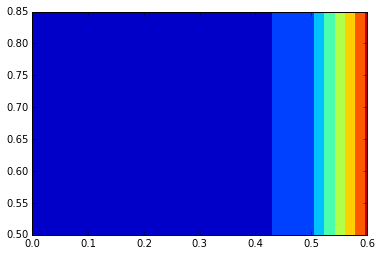

In [99]:
IC_s, Ng_s = AP_IC_v3P(seq_sel_IB, affy_s_IB, 0, 'precomputed', preference, damping, path_scripts, dview, linkage='single', criterion='BIC')
print IC_s, Ng_s, plt.contourf(IC_s.columns, IC_s.index, IC_s)

In [100]:
pref_s, damp_s = AP_IC_findmin(IC_s)
print pref_s, damp_s

0.1 0.65


In [101]:
s_groups_IB = AP_clustering_v3P(seq_sel_IB, affy_s_IB, 0, 'precomputed', pref_s, damp_s, path_scripts, linkage = 'single')

In [102]:
len(set(s_groups_IB))

3

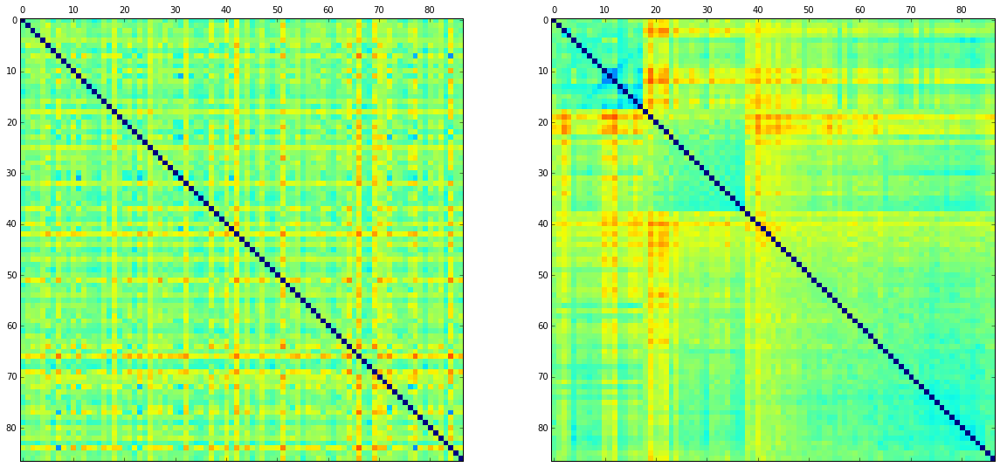

In [103]:
draw_AP_dist_mat(dist_s_IB, s_groups_IB)

## Cluster genes I

In [122]:
preference = np.arange(-10.0, -7.0, 0.1)
damping = np.arange(0.8, 1.0, 0.05)

In [123]:
affy_g_IB = seq_sel_IB.T.corr()
dist_g_IB = 1 - affy_g_IB

         -10.0     -9.9      -9.8      -9.7      -9.6      -9.5      -9.4   \
0.80 -1233.574  -1239.14  -1239.14  -1239.14 -1222.353 -1249.565 -1249.565   
0.85 -1275.018 -1275.018 -1275.018 -1275.018 -1310.187 -1310.187 -1310.187   
0.90 -1253.516 -1262.193 -1249.565 -1249.565 -1249.565 -1249.565 -1294.313   
0.95  -1241.32 -1264.637 -1270.876 -1270.876 -1270.876 -1270.876 -1270.876   

         -9.3      -9.2      -9.1     ...        -8.0      -7.9      -7.8   \
0.80 -1249.565 -1249.565 -1237.327    ...    -1258.281 -1265.195 -1265.195   
0.85 -1294.313 -1294.313 -1294.313    ...    -1314.748 -1305.663 -1305.663   
0.90 -1294.313 -1294.313 -1294.313    ...    -1314.748 -1314.748 -1314.748   
0.95 -1270.876 -1270.876 -1270.876    ...    -1259.382 -1259.382 -1259.382   

         -7.7      -7.6      -7.5      -7.4      -7.3      -7.2      -7.1   
0.80 -1291.613  -1304.08 -1290.882 -1274.709 -1274.709 -1337.423 -1312.557  
0.85 -1305.663 -1314.748 -1314.748 -1314.748 -1310.017 -1310.017

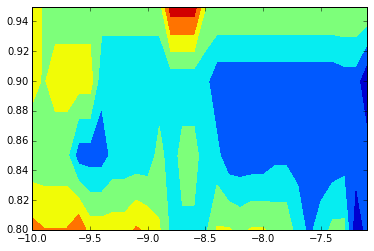

In [124]:
IC_g, Ng_g = AP_IC_v3P(seq_sel_IB, affy_g_IB, 1, 'precomputed', preference, damping, path_scripts, dview, linkage='single', criterion='BIC')
print IC_g, Ng_g, plt.contourf(IC_g.columns, IC_g.index, IC_g)

In [125]:
pref_g, damp_g = AP_IC_findmin(IC_g)
print pref_g, damp_g

-7.1 0.9


In [126]:
g_groups_IB = AP_clustering_v3P(seq_sel_IB, affy_g_IB, 1, 'precomputed', pref_g, damp_g, path_scripts, linkage = 'single')

In [127]:
len(set(g_groups_IB))

18

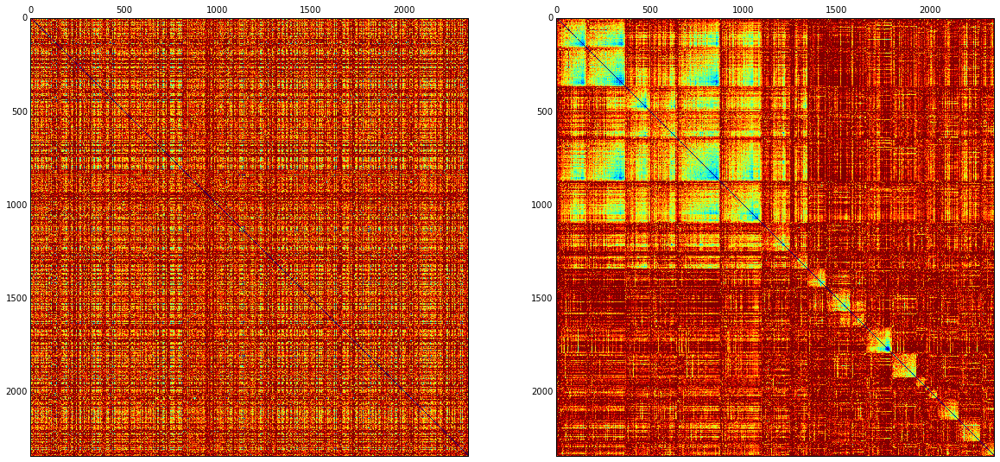

In [129]:
draw_AP_dist_mat(dist_g_IB, g_groups_IB)

## Draw heatmap

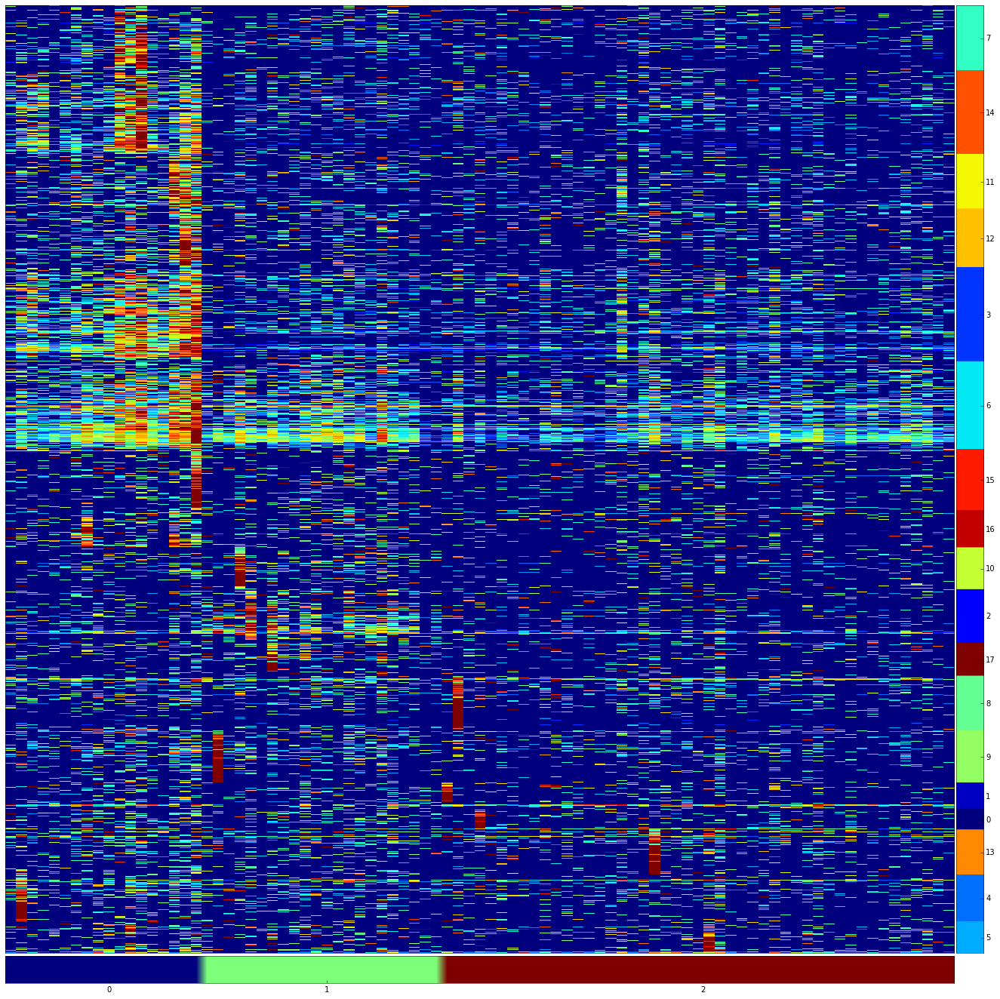

In [130]:
draw_heatmap(seq_sel_IB, s_groups_IB, g_groups_IB)

## Select differentially expressed gene groups: #2 (bulge markers), #3 (subset of differentiated markers). #6 (house-keeping genes and genes which seem to change with total mRNA expression) and #7 (terminal differentiation markers, not enough cells) is ignored.

In [144]:
genes_sel = g_groups_IB[g_groups_IB.isin([3, 2])].index

In [148]:
seq_sel_IB_ = seq_sel_IB.ix[genes_sel]

## Cluster cells with selected genes

In [149]:
preference = np.arange(-1.5, 0.5, 0.1)
damping = np.arange(0.5, 0.9, 0.05)

In [150]:
affy_s_IB = seq_sel_IB_.corr()
dist_s_IB = 1 - affy_s_IB

(     -1.500000e+00 -1.400000e+00 -1.300000e+00 -1.200000e+00 -1.100000e+00  \
 0.50     -13.78045     -13.78045     -13.78045     -13.78045     -38.87935   
 0.55     -13.78045     -13.78045     -13.78045     -13.78045     -38.87935   
 0.60     -13.78045     -13.78045     -13.78045     -13.78045     -38.87935   
 0.65     -13.78045     -13.78045     -13.78045     -13.78045     -38.87935   
 0.70     -13.78045     -13.78045     -13.78045     -13.78045     -38.87935   
 0.75     -13.78045     -13.78045     -13.78045     -13.78045     -38.87935   
 0.80     -13.78045     -13.78045     -13.78045     -13.78045     -38.87935   
 0.85     -13.78045     -13.78045     -13.78045     -13.78045     -38.87935   
 
      -1.000000e+00 -9.000000e-01 -8.000000e-01 -7.000000e-01 -6.000000e-01  \
 0.50     -38.87935     -38.87935     -38.87935     -38.87935     -38.87935   
 0.55     -38.87935     -38.87935     -38.87935     -38.87935     -38.87935   
 0.60     -38.87935     -38.87935     -38.87935   

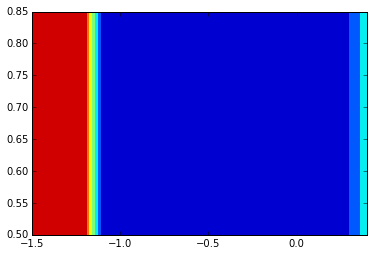

In [151]:
IC_s, Ng_s = AP_IC_v3P(seq_sel_IB_, affy_s_IB, 0, 'precomputed', preference, damping, path_scripts, dview, linkage='single', criterion='BIC')
IC_s, Ng_s, plt.contourf(IC_s.columns, IC_s.index, IC_s)

In [152]:
pref_s, damp_s = AP_IC_findmin(IC_s)
print pref_s, damp_s

-0.6 0.65


In [153]:
s_groups_IB = AP_clustering_v3P(seq_sel_IB_, affy_s_IB, 0, 'precomputed', pref_s, damp_s, path_scripts, linkage = 'single')

In [154]:
len(set(s_groups_IB))

3

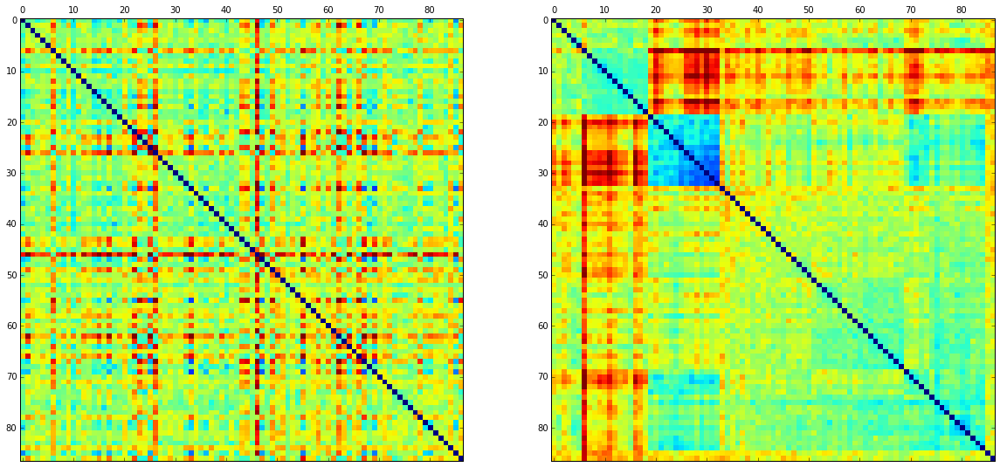

In [156]:
draw_AP_dist_mat(dist_s_IB, s_groups_IB)

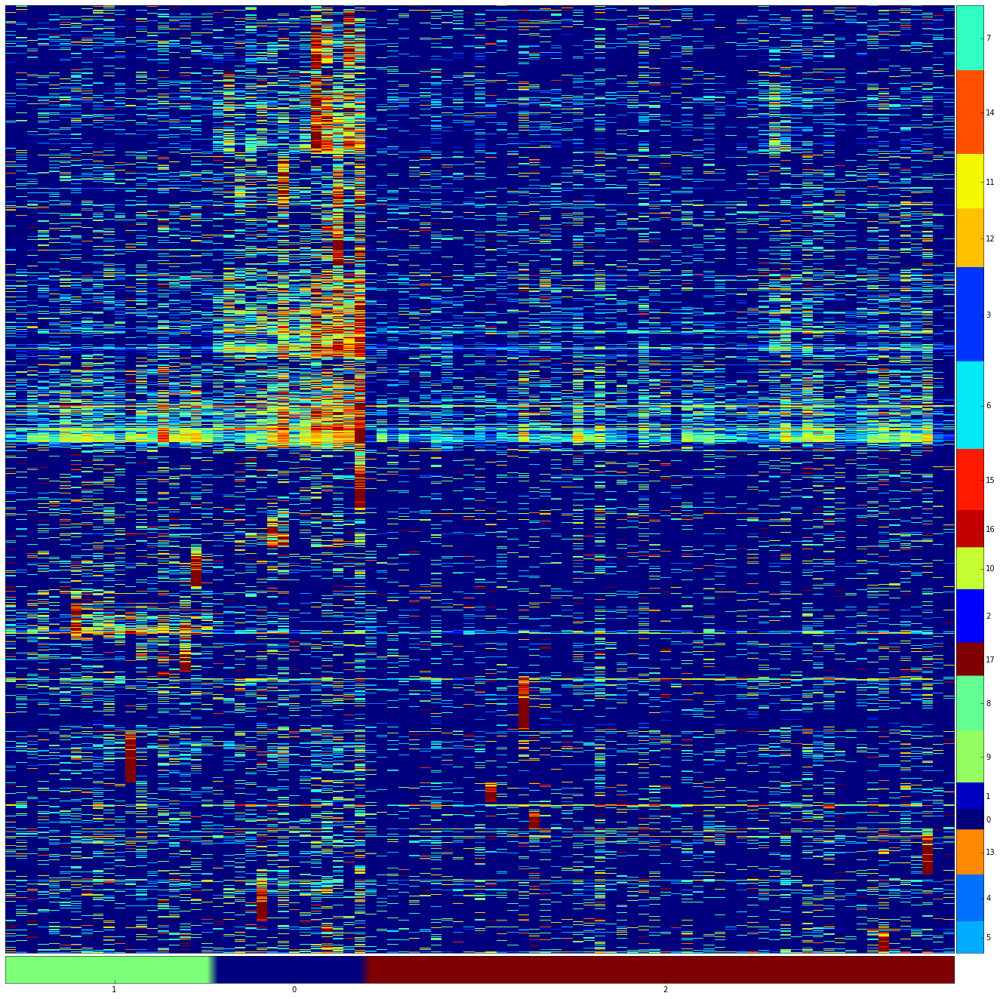

In [157]:
draw_heatmap(seq_sel_IB, s_groups_IB, g_groups_IB)

## Restrict number of gene groups shown in heatmap and order and/or inverse groups

In [159]:
#limit gene groups to groups which show a clear modular pattern

g_groups_IB = g_groups_IB[g_groups_IB.isin([2,3,14])]

In [161]:
#insert genes which where identified as linked to the IB population in the 1st lvl clustering

genes_tmp = set(g_groups_1st[g_groups_1st == 8].index).difference(set(g_groups_IB))

for g in genes_tmp:
    g_groups_IB.ix[g] = 0

In [162]:
#perform single linkage with gene group 0 (inserted K6 markers)

g_groups_IB = AP_fuse_clusters(log2Transform(seq.ix[s_groups_IB.index]), g_groups_IB, 1, [0], linkage='single')


Calculating binary logarithm of x + 1


In [164]:
#reorder cell groups

s_groups_IB = AP_groups_reorder(s_groups_IB, [2,1,0])

In [170]:
#invert cell groups

s_groups_IB = AP_invert_index(s_groups_IB, 2)

In [167]:
#reorder gene groups

g_groups_IB = AP_groups_reorder(g_groups_IB, [0,2,3,14])


Calculating binary logarithm of x + 1


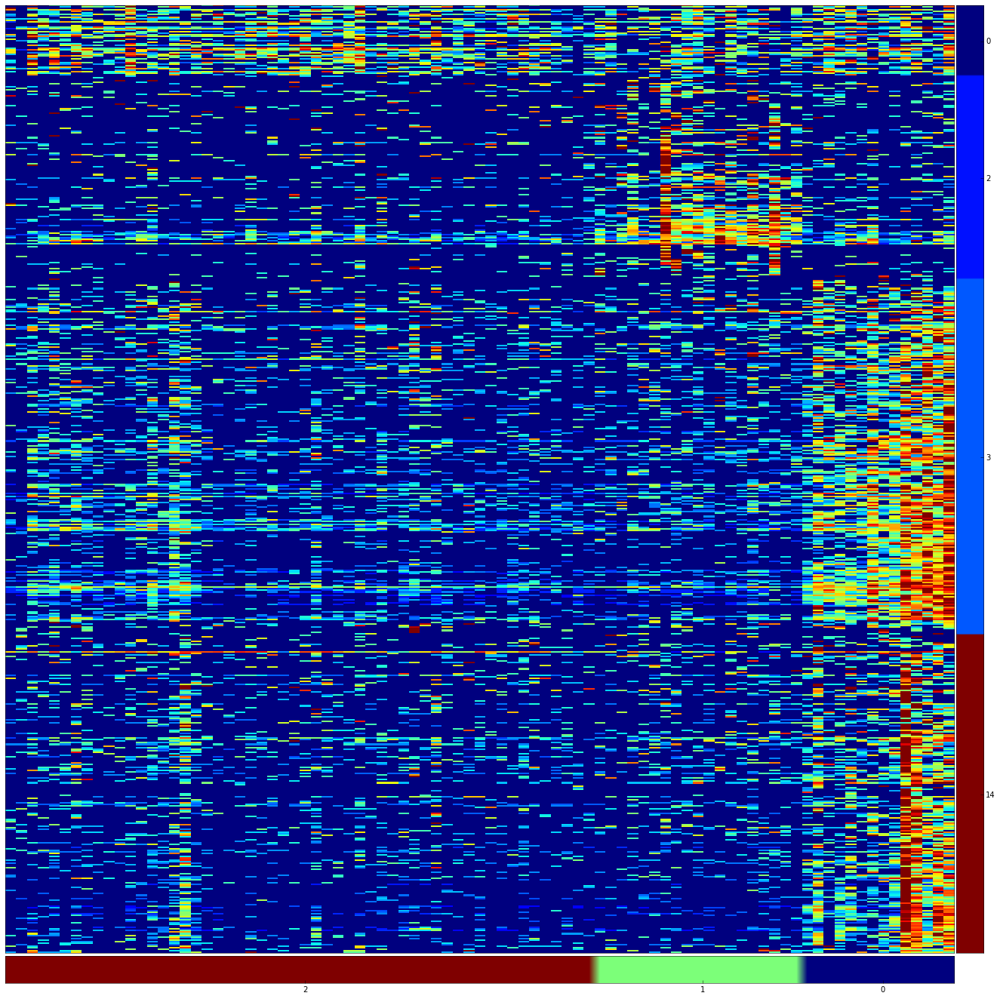

In [171]:
draw_heatmap(log2Transform(seq), s_groups_IB, g_groups_IB)

## Checkpoint

In [172]:
#saveData_v1(s_groups_IB, path_output, exp_id, 's_groups_IB')
#saveData_v1(g_groups_IB, path_output, exp_id, 'g_groups_IB')

In [1343]:
s_groups_IB = loadData_v1(path_output, exp_id, 's_groups_IB', 'Series')
g_groups_IB = loadData_v1(path_output, exp_id, 'g_groups_IB', 'Series')

## Calculate robustness

In [174]:
robustness_IB, robustness_IB_null = robustness_AP_v1P(seq_sel_IB_, 
                                                        s_groups_IB, 
                                                        seq_sel_IB_.index, 
                                                        0.75, 
                                                        100, 
                                                        -0.6,
                                                        0.65, 
                                                        dview)

## Checkpoint

In [176]:
#saveData_v1(robustness_IB, path_output, exp_id, 'robustness_IB')
#saveData_v1(robustness_IB_null, path_output, exp_id, 'robustness_IB_null')

# Subcluster outer bulge cells

## Select features

In [177]:
seq = loadData_v1(path_input, exp_id, 'seq', 'DataFrame')

In [178]:
seq_OB = seq[OB_cells]

In [179]:
len(seq_OB.columns)

273


Dropping spikes from dataset

Dropping repeats from dataset

Dropping unexpressed genes from dataset

After mean expression cutoff of 0.1, 7450 genes remain

After correlation cutoff of 5, 6686 genes remain

Optimization terminated successfully.
         Current function value: 1583.971723
         Iterations: 30
         Function evaluations: 58

After high variance feature selection, 2500 genes remain

Calculating binary logarithm of x + 1


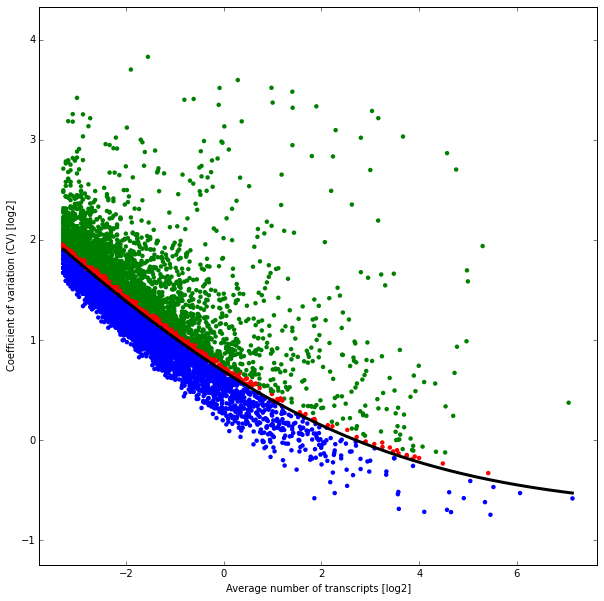

In [180]:
seq_sel_OB = select_features_v1(seq_OB, 0.10, 5, 2500, path_input, percentile=95, return_all=False)

## Remove genes which where identified as early immediate genes (#2) and housekeeping genes (#0) in the 1st lvl clustering, but include genes which have been defined as linked to the OB cluster in 1st lvl clustering

In [181]:
genes_sel = list(set(seq_sel_OB.index.difference(g_groups_1st[g_groups_1st.isin([2,0])].index)))
genes_sel = list(set(genes_sel + list(g_groups_1st[g_groups_1st==6].index)))

seq_sel_OB = log2Transform(seq_OB.ix[genes_sel])


Calculating binary logarithm of x + 1


In [182]:
len(seq_sel_OB.index)

2367

## Checkpoint

In [183]:
saveData_v1(seq_sel_OB, path_output, exp_id, 'seq_sel_OB')

In [184]:
seq_sel_OB = loadData_v1(path_output, exp_id, 'seq_sel_OB', 'DataFrame')

## Cluster cells I

In [192]:
preference = np.arange(-1.5, 0.0, 0.1)
damping = np.arange(0.5, 0.9, 0.05)

In [193]:
affy_s_OB = seq_sel_OB.corr()
dist_s_OB = 1 - affy_s_OB

          -1.5      -1.4      -1.3      -1.2      -1.1      -1.0      -0.9  \
0.50 -233.2475 -232.6691 -232.6691 -233.2475 -232.6691 -232.6691 -232.6691   
0.55 -233.2475 -232.6691 -232.6691 -232.6691 -232.6691 -232.6691 -232.6691   
0.60 -232.6691 -232.6691 -232.6691 -232.6691 -232.6691 -232.6691 -232.6691   
0.65 -236.1747 -232.6691 -232.6691 -232.6691 -232.6691 -232.6691 -232.6691   
0.70 -233.2475 -232.6691 -232.6691 -232.6691 -232.6691 -232.6691 -232.6691   
0.75 -232.6691 -232.6691 -232.6691 -232.6691 -232.6691 -232.6691 -232.6691   
0.80 -232.6691 -232.6691 -232.6691 -232.6691 -232.6691 -232.6691 -232.6691   
0.85 -232.6691 -232.6691 -232.6691 -232.6691 -232.6691 -232.6691 -232.6691   

          -0.8      -0.7      -0.6      -0.5      -0.4      -0.3      -0.2  \
0.50 -232.6691 -233.2596 -234.5073 -229.9959 -229.9959 -229.9959 -229.9959   
0.55 -232.6691 -233.2596 -233.2596 -229.9959 -229.9959 -229.9959 -229.9959   
0.60 -232.6691 -231.9584 -234.5073 -229.9959 -229.9959 -229.995

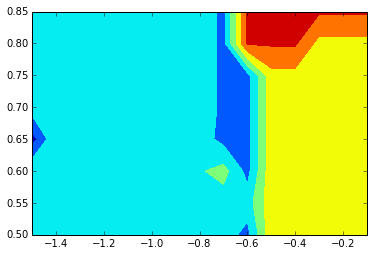

In [194]:
IC_s, Ng_s = AP_IC_v3P(seq_sel_OB, affy_s_OB, 0, 'precomputed', preference, damping, path_scripts, dview, linkage='single', criterion='BIC')
print IC_s, Ng_s, plt.contourf(IC_s.columns, IC_s.index, IC_s)

In [195]:
pref_s, damp_s = AP_IC_findmin(IC_s)
print pref_s, damp_s

-1.5 0.65


In [196]:
s_groups_OB = AP_clustering_v3P(seq_sel_OB, affy_s_OB, 0, 'precomputed', pref_s, damp_s, path_scripts, linkage = 'single')

In [197]:
len(set(s_groups_OB))

3

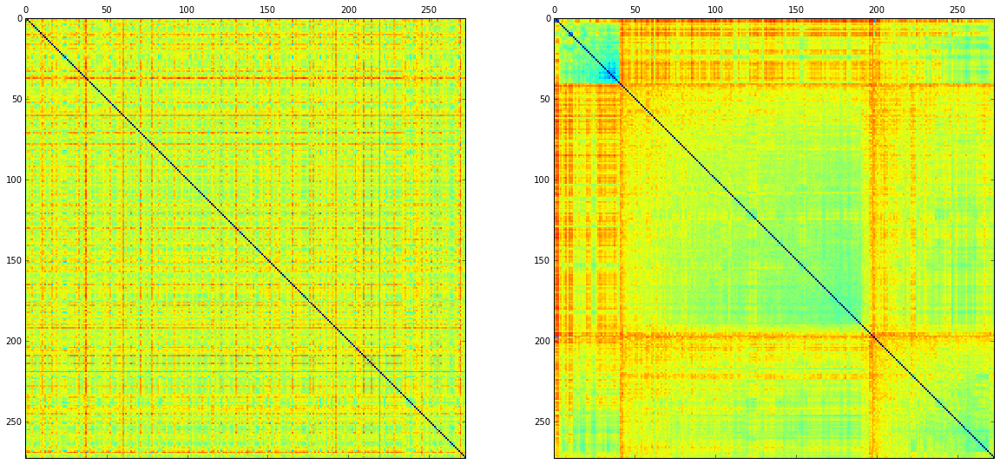

In [198]:
draw_AP_dist_mat(dist_s_OB, s_groups_OB)

## Cluster genes I

In [202]:
preference = np.arange(-8.0, -4.0, 0.1)
damping = np.arange(0.8, 1.0, 0.05)

In [203]:
affy_g_OB = seq_sel_OB.T.corr()
dist_g_OB = 1 - affy_g_OB

          -8.0      -7.9      -7.8      -7.7      -7.6      -7.5      -7.4  \
0.80 -1303.788 -1266.925 -1266.925 -1291.034 -1291.034 -1291.246 -1305.227   
0.85 -1325.746   -1332.5   -1332.5 -1367.111 -1367.111 -1367.111 -1367.111   
0.90   -1332.5   -1332.5 -1367.111 -1367.111 -1367.111 -1367.111 -1367.111   
0.95 -1400.199 -1400.199 -1400.199 -1400.199 -1400.199 -1400.199 -1400.199   

          -7.3      -7.2      -7.1    ...         -5.0      -4.9      -4.8  \
0.80 -1305.227 -1305.227 -1318.271    ...    -1428.662 -1416.479 -1414.023   
0.85 -1367.111 -1369.016 -1369.016    ...    -1422.775 -1422.775 -1422.775   
0.90 -1369.016 -1369.016 -1369.016    ...    -1414.023 -1414.023 -1411.136   
0.95 -1400.199 -1400.199 -1400.199    ...    -1430.551 -1430.551 -1430.586   

          -4.7      -4.6      -4.5      -4.4      -4.3      -4.2      -4.1  
0.80 -1414.023 -1437.374 -1437.374 -1437.374 -1435.206 -1430.586 -1430.586  
0.85 -1447.312 -1447.312 -1447.312 -1444.056 -1430.586 -1430.586

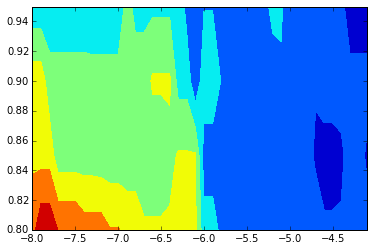

In [204]:
IC_g, Ng_g = AP_IC_v3P(seq_sel_OB, affy_g_OB, 1, 'precomputed', preference, damping, path_scripts, dview, linkage='single', criterion='BIC')
print IC_g, Ng_g, plt.contourf(IC_g.columns, IC_g.index, IC_g)

In [205]:
pref_g, damp_g = AP_IC_findmin(IC_g)
print pref_g, damp_g

-4.2 0.95


In [206]:
g_groups_OB = AP_clustering_v3P(seq_sel_OB, affy_g_OB, 1, 'precomputed', pref_g, damp_g, path_scripts, linkage = 'single')

In [207]:
len(set(g_groups_OB))

17

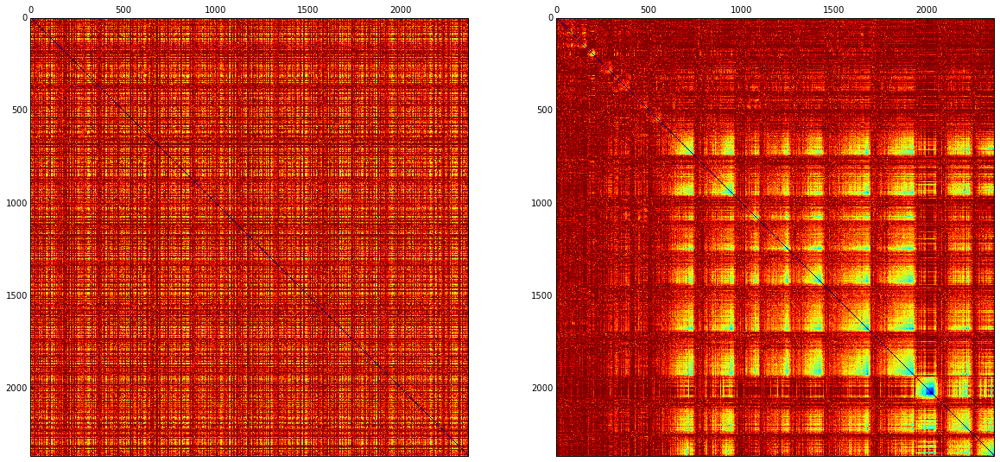

In [208]:
draw_AP_dist_mat(dist_g_OB, g_groups_OB)

## Draw heatmap

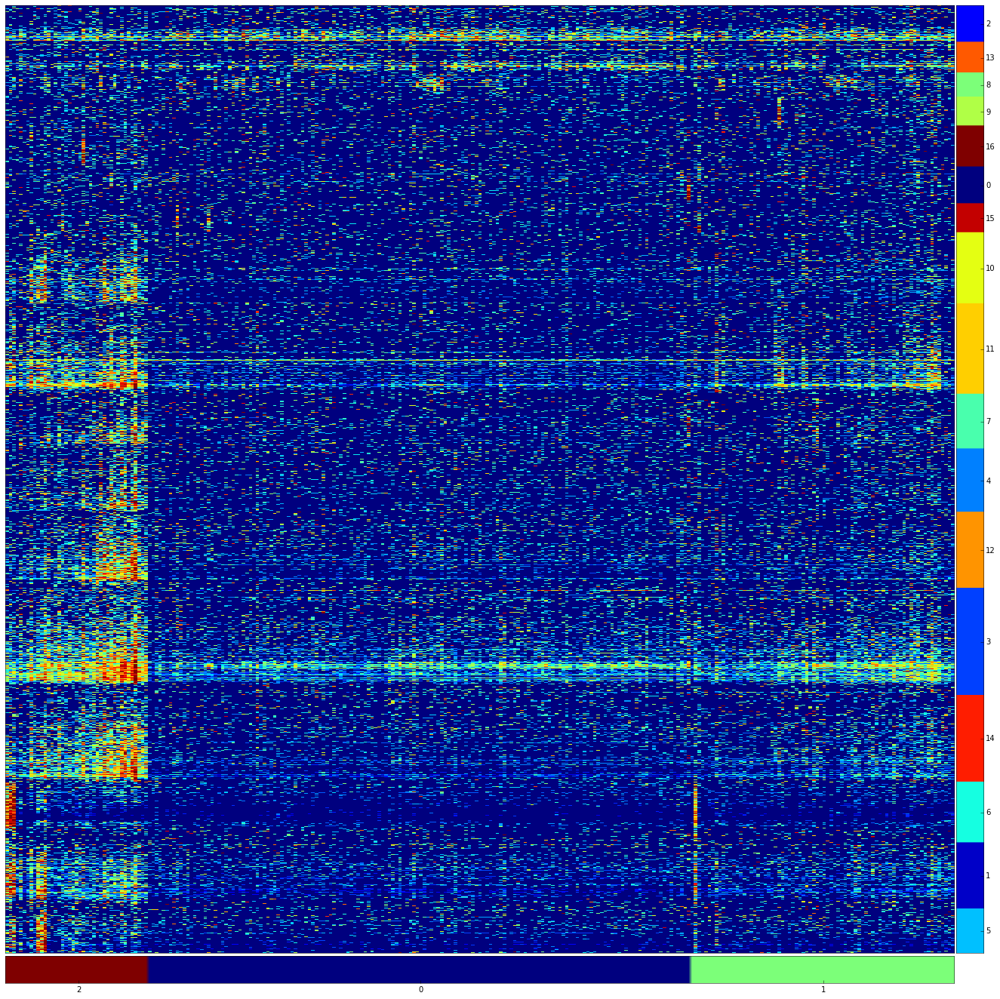

In [209]:
draw_heatmap(seq_sel_OB, s_groups_OB, g_groups_OB)

## Select potentially differentially expressed gene groups: #2, 13 (bulge markers), #8 (Aspn/Gli1 cluster), #11 (Krt79 cluster) and #14 (subset of differentiation markers). Ignore #3 (ribosomal and house-keeping genes)

In [324]:
genes_sel = g_groups_OB[g_groups_OB.isin([2,13,8,11,14])].index

In [325]:
seq_sel_OB_ = seq_sel_OB.ix[genes_sel]

In [326]:
len(seq_sel_OB_.index)

671

## Cluster cells with selected genes

In [327]:
preference = np.arange(-2.0, 0.0, 0.1)
damping = np.arange(0.5, 0.9, 0.05)

In [328]:
affy_s_OB = seq_sel_OB_.corr()
dist_s_OB = 1 - affy_s_OB

(          -2.0      -1.9      -1.8      -1.7      -1.6      -1.5      -1.4  \
 0.50 -182.8951 -181.8737 -181.8737 -181.8737 -181.8737 -181.8737 -181.8737   
 0.55 -182.8951 -182.8951 -181.8737 -181.8737 -182.8951 -182.8951 -182.8951   
 0.60 -182.8951 -182.8951 -182.8951 -182.8951 -182.8951 -182.8951 -182.8951   
 0.65 -182.8951 -181.8737 -182.8951 -182.8951 -182.8951 -182.8951 -182.8951   
 0.70 -181.8737 -181.8737 -181.8737 -181.8737 -181.8737 -181.8737 -181.8737   
 0.75 -181.8737 -181.8737 -181.8737 -181.8737 -181.8737 -181.8737 -181.8737   
 0.80 -181.8737 -181.8737 -181.8737 -181.8737 -181.8737 -181.8737 -181.8737   
 0.85 -181.8737 -181.8737 -181.8737 -181.8737 -181.8737 -181.8737 -179.4784   
 
           -1.3      -1.2      -1.1      -1.0      -0.9      -0.8      -0.7  \
 0.50 -181.8737 -181.8737 -184.7095 -184.7095 -184.7095 -179.4784 -180.9974   
 0.55 -182.8951 -181.8737 -184.7095 -184.7095 -184.7095 -179.4784 -179.4784   
 0.60 -182.8951 -181.8737 -184.7095 -184.7095 -184

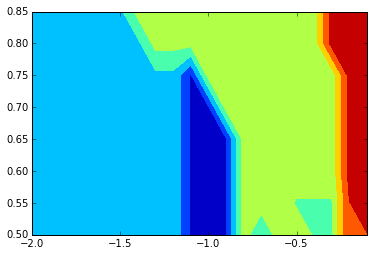

In [329]:
IC_s, Ng_s = AP_IC_v3P(seq_sel_OB_, affy_s_OB, 0, 'precomputed', preference, damping, path_scripts, dview, linkage='single', criterion='BIC')
IC_s, Ng_s, plt.contourf(IC_s.columns, IC_s.index, IC_s)

In [330]:
pref_s, damp_s = AP_IC_findmin(IC_s)
print pref_s, damp_s

-1.0 0.6


In [331]:
s_groups_OB = AP_clustering_v3P(seq_sel_OB_, affy_s_OB, 0, 'precomputed', -0.7, 0.5, path_scripts, linkage = 'single')

In [332]:
len(set(s_groups_OB))

5

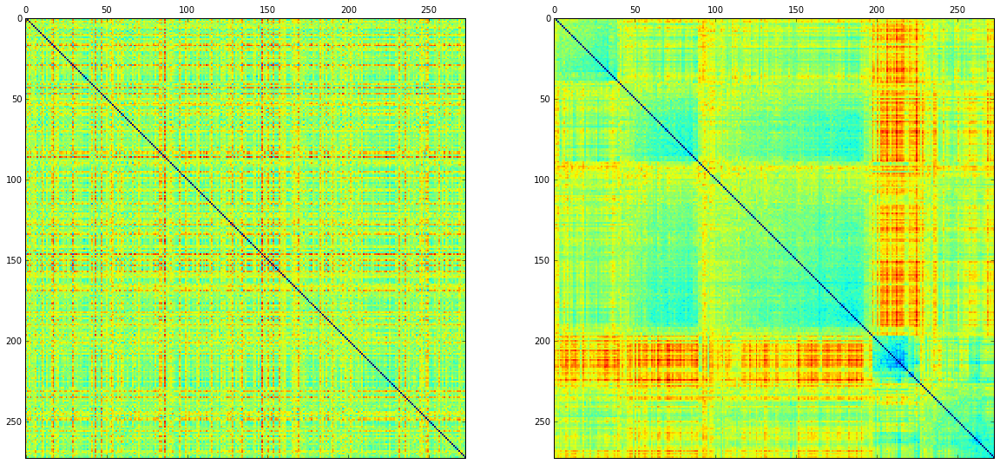

In [333]:
draw_AP_dist_mat(dist_s_OB, s_groups_OB)

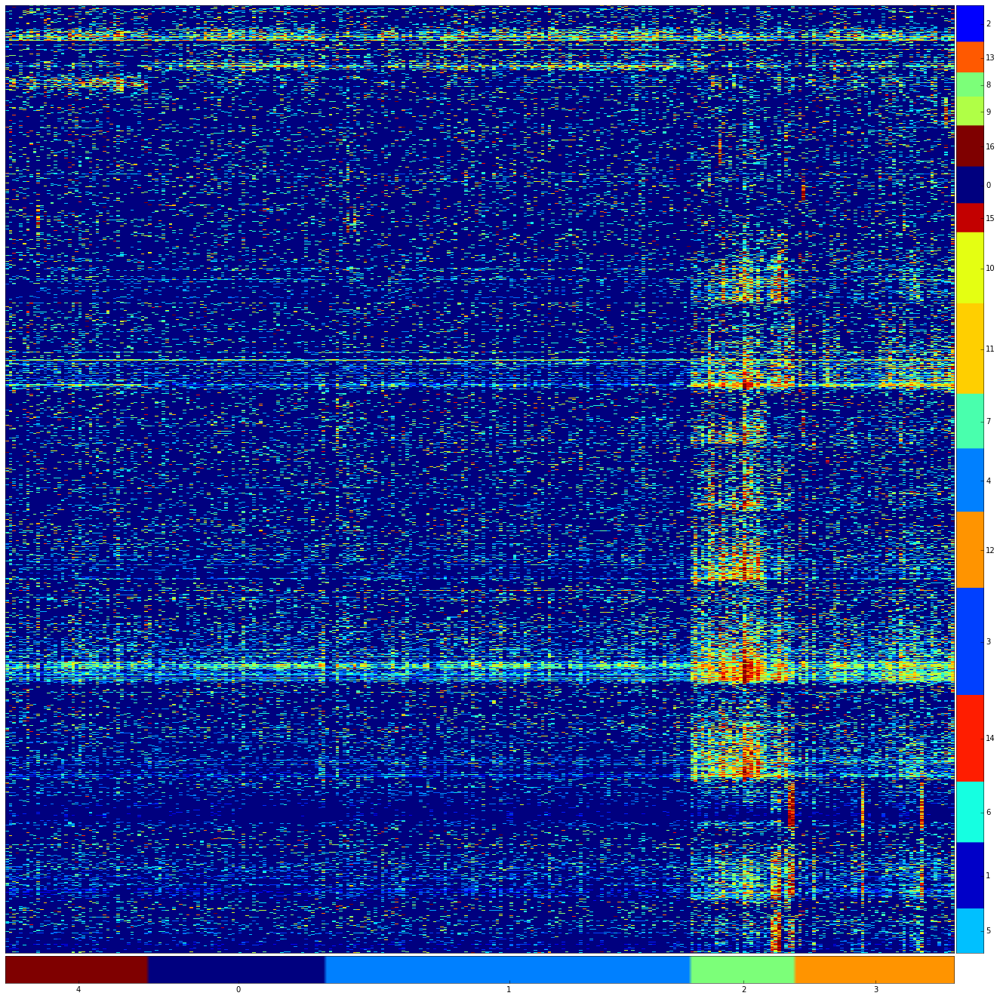

In [334]:
draw_heatmap(seq_sel_OB, s_groups_OB, g_groups_OB)

## Restrict gene groups for better heatmap visualization and reorder

In [339]:
s_groups_OB = AP_groups_reorder(s_groups_OB, [1,0,4,3,2])

In [337]:
g_groups_OB = g_groups_OB[g_groups_OB.isin([2,13,8,11,14])]


Calculating binary logarithm of x + 1


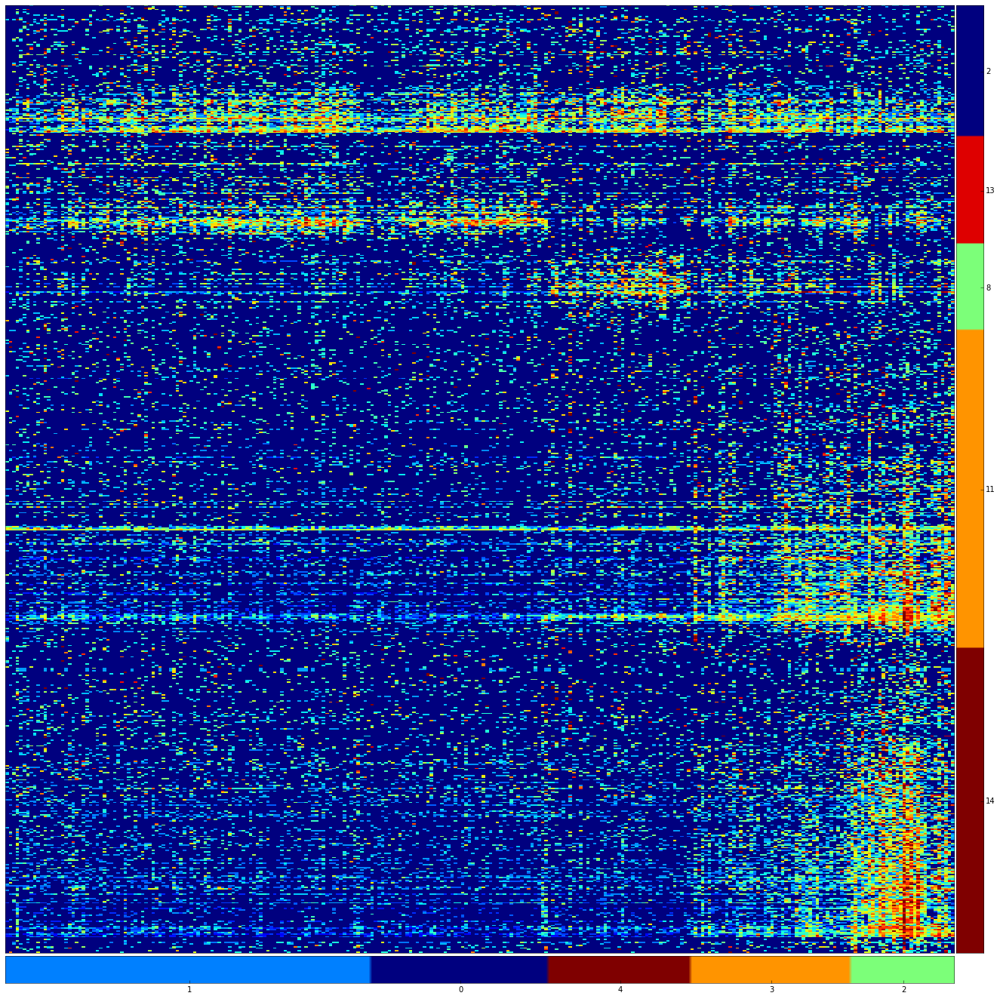

In [340]:
draw_heatmap(log2Transform(seq), s_groups_OB, g_groups_OB)

## Checkpoint

In [341]:
#saveData_v1(s_groups_OB, path_output, exp_id, 's_groups_OB')
#saveData_v1(g_groups_OB, path_output, exp_id, 'g_groups_OB')

In [342]:
s_groups_OB = loadData_v1(path_output, exp_id, 's_groups_OB', 'Series')
g_groups_OB = loadData_v1(path_output, exp_id, 'g_groups_OB', 'Series')

## Calculate robustness

In [343]:
robustness_OB, robustness_OB_null = robustness_AP_v1P(seq_sel_OB_, 
                                                        s_groups_OB, 
                                                        seq_sel_OB_.index, 
                                                        0.75, 
                                                        100, 
                                                        -0.7, 
                                                        0.5, 
                                                        dview)

## Checkpoint

In [344]:
saveData_v1(robustness_OB, path_output, exp_id, 'robustness_OB')
saveData_v1(robustness_OB_null, path_output, exp_id, 'robustness_OB_null')

# Subcluster uHF cells

## Select features

In [435]:
seq = loadData_v1(path_input, exp_id, 'seq', 'DataFrame')

In [436]:
seq_uHF = seq[uHF_cells]

In [437]:
len(seq_uHF.columns)

364


Dropping spikes from dataset

Dropping repeats from dataset

Dropping unexpressed genes from dataset

After mean expression cutoff of 0.1, 7060 genes remain

After correlation cutoff of 5, 6046 genes remain

Optimization terminated successfully.
         Current function value: 1279.583954
         Iterations: 33
         Function evaluations: 61

After high variance feature selection, 2500 genes remain

Calculating binary logarithm of x + 1


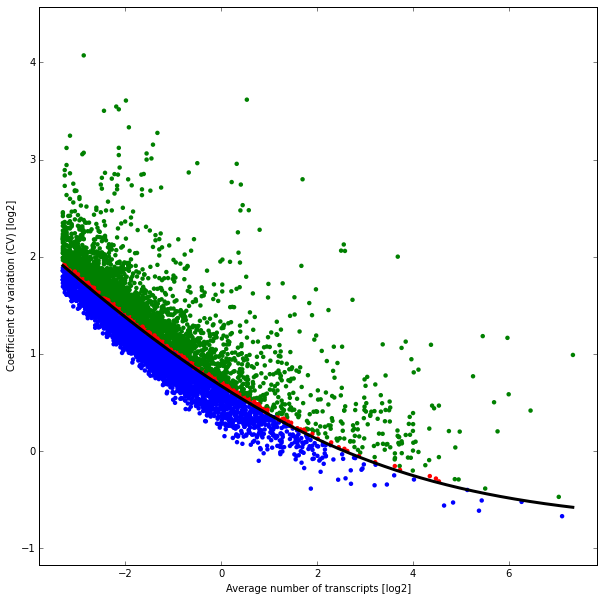

In [438]:
seq_sel_uHF = select_features_v1(seq_uHF, 0.10, 5, 2500, path_input, percentile=95, return_all=False)

## Remove genes which where identified as early immediate genes (#2) and housekeeping genes (#0) in the 1st lvl clustering, but include genes which have been defined as linked to the uHF cluster in 1st lvl clustering

In [439]:
genes_sel = list(set(seq_sel_uHF.index.difference(g_groups_1st[g_groups_1st.isin([2,0])].index)))
genes_sel = list(set(genes_sel + list(g_groups_1st[g_groups_1st==13].index)))

seq_sel_uHF = log2Transform(seq_uHF.ix[genes_sel])


Calculating binary logarithm of x + 1


In [440]:
len(seq_sel_uHF.index)

2291

## Checkpoint

In [441]:
saveData_v1(seq_sel_uHF, path_output, exp_id, 'seq_sel_uHF')

In [442]:
seq_sel_uHF = loadData_v1(path_output, exp_id, 'seq_sel_uHF', 'DataFrame')

## Cluster cells I

In [443]:
preference = np.arange(-3.0, 0.0, 0.1)
damping = np.arange(0.5, 0.9, 0.05)

In [444]:
affy_s_uHF = seq_sel_uHF.corr()
dist_s_uHF = 1 - affy_s_uHF

(          -3.0      -2.9      -2.8      -2.7      -2.6      -2.5      -2.4  \
 0.50 -228.9904 -239.6543 -228.9904 -228.9904 -228.9904 -228.9904 -228.9904   
 0.55 -239.6543 -228.9904 -228.9904 -228.9904 -228.9904 -228.9904 -228.9904   
 0.60 -228.9904 -228.9904 -228.9904 -228.9904 -228.9904 -228.9904 -228.9904   
 0.65 -228.7759  -240.851 -228.9904 -228.9904 -228.9904 -228.9904 -228.9904   
 0.70 -239.6543 -231.7819 -228.9904 -228.9904 -228.9904 -228.9904 -228.9904   
 0.75  -231.497  -231.497  -231.497  -231.497 -228.7759 -228.9904 -228.9904   
 0.80 -228.7759 -228.7759 -228.7759 -228.7759 -228.7759 -228.7759 -228.7759   
 0.85 -228.7759 -228.7759 -228.7759 -228.7759 -228.7759 -228.7759 -228.7759   
 
           -2.3      -2.2      -2.1    ...         -1.0      -0.9      -0.8  \
 0.50 -228.9904 -228.9904 -228.9904    ...    -247.6647 -247.0213 -247.0213   
 0.55 -228.9904 -228.9904 -228.9904    ...    -247.6647 -247.0213 -247.0213   
 0.60 -228.9904 -228.9904 -228.9904    ...    -247

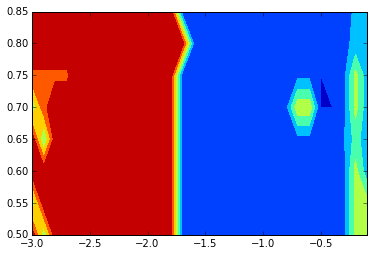

In [445]:
IC_s, Ng_s = AP_IC_v3P(seq_sel_uHF, affy_s_uHF, 0, 'precomputed', preference, damping, path_scripts, dview, linkage='single', criterion='BIC')
IC_s, Ng_s, plt.contourf(IC_s.columns, IC_s.index, IC_s)

In [446]:
pref_s, damp_s = AP_IC_findmin(IC_s)
print pref_s, damp_s

-0.4 0.7


In [447]:
s_groups_uHF = AP_clustering_v3P(seq_sel_uHF, affy_s_uHF, 0, 'precomputed', pref_s, damp_s, path_scripts, linkage = 'single')

In [448]:
len(set(s_groups_uHF))

6

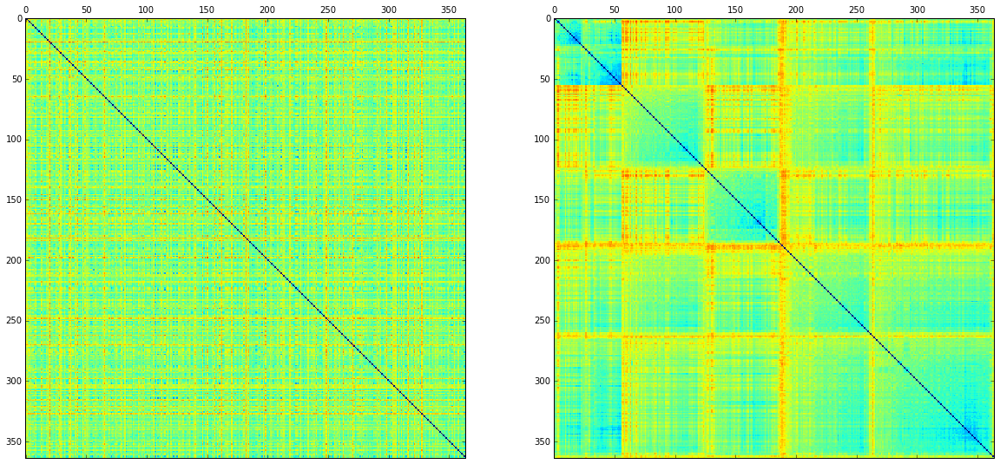

In [449]:
draw_AP_dist_mat(dist_s_uHF, s_groups_uHF)

## Cluster genes I

In [450]:
preference = np.arange(-6.0, -3.0, 0.1)
damping = np.arange(0.75, 0.9, 0.05)

In [451]:
affy_g_uHF = seq_sel_uHF.T.corr()
dist_g_uHF = 1 - affy_g_uHF

In [ ]:
IC_g, Ng_g = AP_IC_v3P(seq_sel_uHF, affy_g_uHF, 1, 'precomputed', preference, damping, path_scripts, dview, linkage='single', criterion='BIC')
IC_g, Ng_g, plt.contourf(IC_g.columns, IC_g.index, IC_g)

In [453]:
pref_g, damp_g = AP_IC_findmin(IC_g)
print pref_g, damp_g

-3.2 0.9


In [454]:
g_groups_uHF = AP_clustering_v3P(seq_sel_uHF, affy_g_uHF, 1, 'precomputed', pref_g, damp_g, path_scripts, linkage = 'single')

In [455]:
len(set(g_groups_uHF))

16

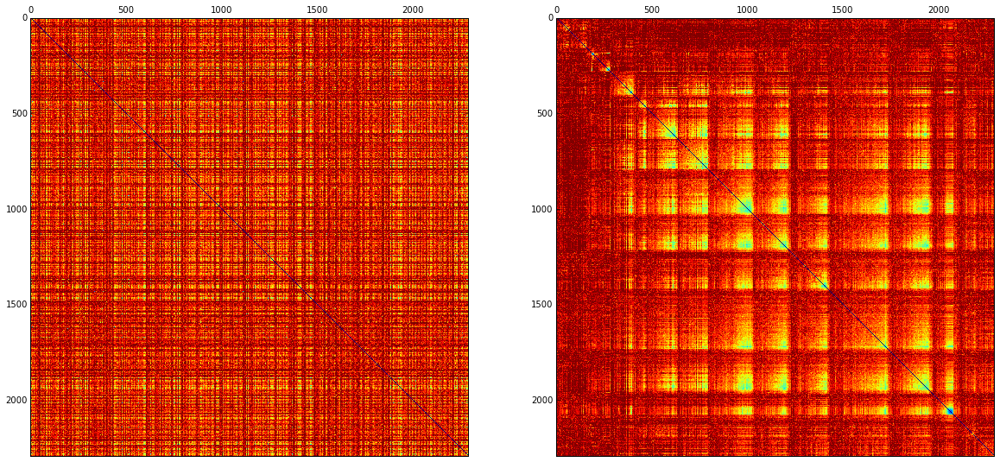

In [456]:
draw_AP_dist_mat(dist_g_uHF, g_groups_uHF)

## Draw heatmap

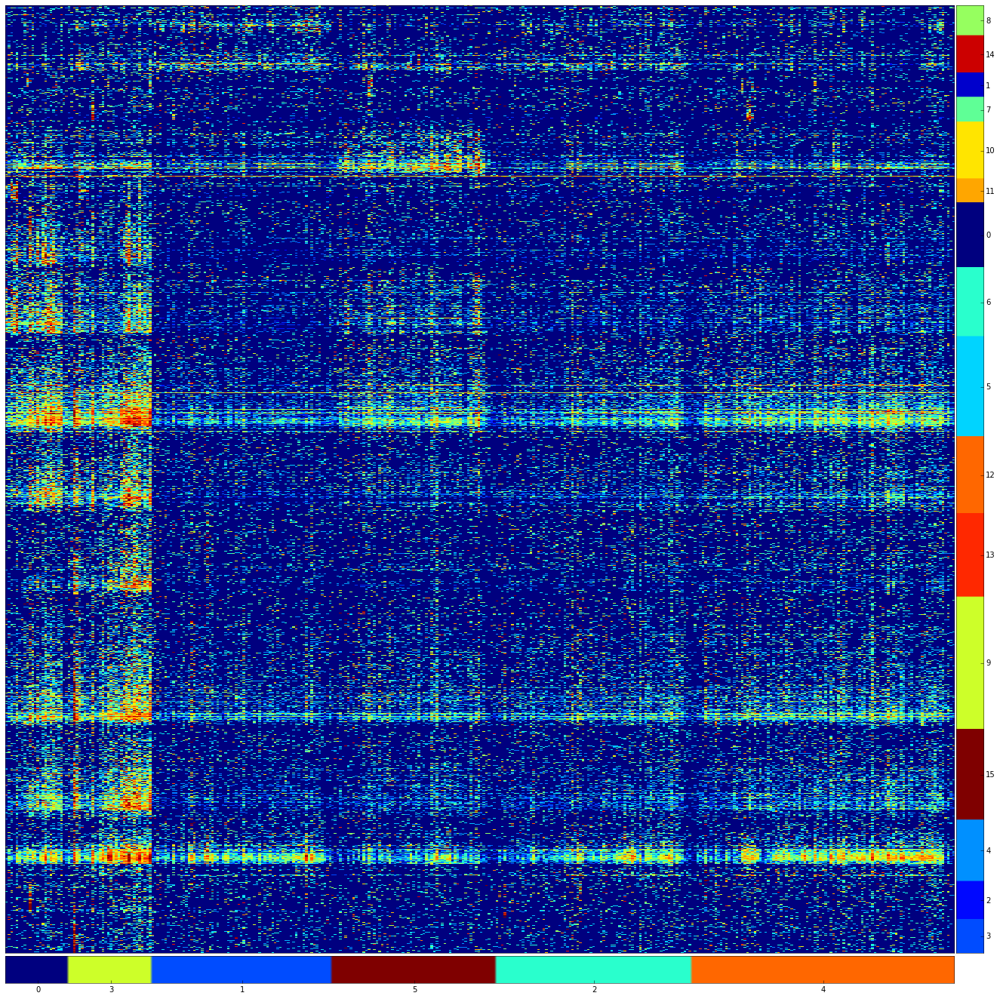

In [457]:
draw_heatmap(seq_sel_uHF, s_groups_uHF, g_groups_uHF)

In [461]:
g_groups_uHF.ix['Flg2']

0

## Select potentially differentially expressed gene groups: #14, #8 (basal cluster), #10 (Defb6/Cst6 cluster), #5 (Krt79 cluster), #9 (mature cluster), #0,#6 (terminal clusters)

In [513]:
genes_sel = g_groups_uHF[g_groups_uHF.isin([14,8,10,5,9,0,6])].index

In [514]:
seq_sel_uHF_ = seq_sel_uHF.ix[genes_sel]

## Cluster cells with selected genes

In [515]:
preference = np.arange(-1.0, 0.5, 0.1)
damping = np.arange(0.5, 1.0, 0.05)

In [516]:
affy_s_uHF_ = seq_sel_uHF_.corr()
dist_s_uHF_ = 1 - affy_s_uHF_

(     -1.000000e+00 -9.000000e-01 -8.000000e-01 -7.000000e-01 -6.000000e-01  \
 0.50     -194.5592     -193.0283     -198.1242     -196.1002     -196.1581   
 0.55     -193.0283     -193.0283     -193.0283     -196.1002     -196.1581   
 0.60     -193.0283     -193.0283      -196.977     -196.1581     -196.1581   
 0.65     -193.0283     -193.0283     -198.1242     -198.1242     -196.1002   
 0.70     -194.5592     -198.1242     -193.0283     -196.1581     -196.1581   
 0.75      -187.348     -198.1242     -193.0283     -196.1581     -196.1581   
 0.80     -194.5592     -198.1242      -196.977     -196.1581     -196.1581   
 0.85     -194.5592      -196.977     -194.6346     -196.1581     -196.1581   
 0.90     -195.1226     -194.6346     -194.6346     -196.1581     -195.8412   
 0.95      -175.573     -194.6346     -194.6346     -194.6346     -175.8932   
 
      -5.000000e-01 -4.000000e-01 -3.000000e-01 -2.000000e-01 -1.000000e-01  \
 0.50     -196.1002     -196.1581     -196.1002   

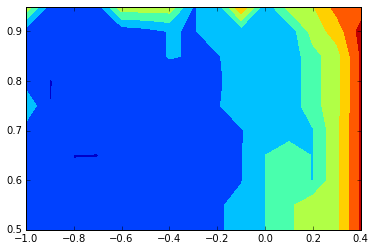

In [517]:
IC_s, Ng_s = AP_IC_v3P(seq_sel_uHF_, affy_s_uHF_, 0, 'precomputed', preference, damping, path_scripts, dview, linkage='single', criterion='BIC')
IC_s, Ng_s, plt.contourf(IC_s.columns, IC_s.index, IC_s)

In [518]:
pref_s, damp_s = AP_IC_findmin(IC_s)
print pref_s, damp_s

-0.8 0.5


In [573]:
s_groups_uHF = AP_clustering_v3P(seq_sel_uHF_, affy_s_uHF_, 0, 'precomputed', -0.1, 0.8, path_scripts, linkage = 'single')

In [536]:
len(set(s_groups_uHF))

9

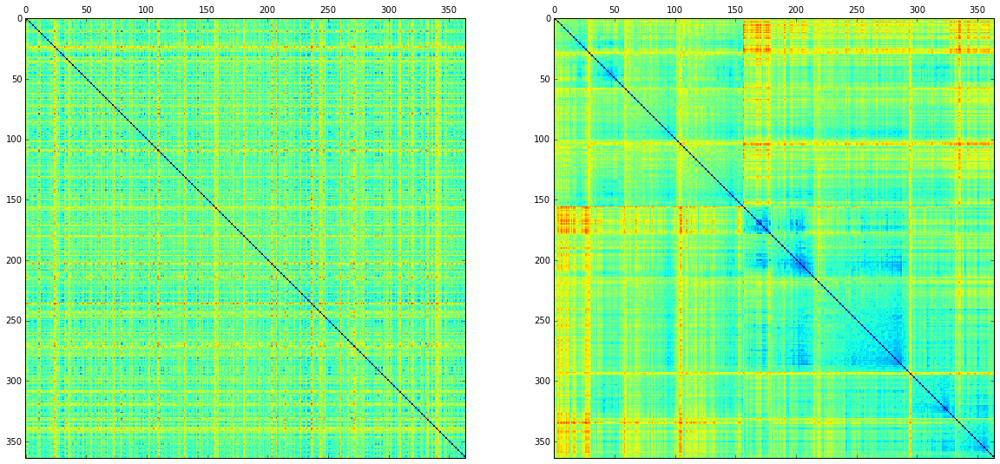

In [537]:
draw_AP_dist_mat(dist_s_uHF_, s_groups_uHF)

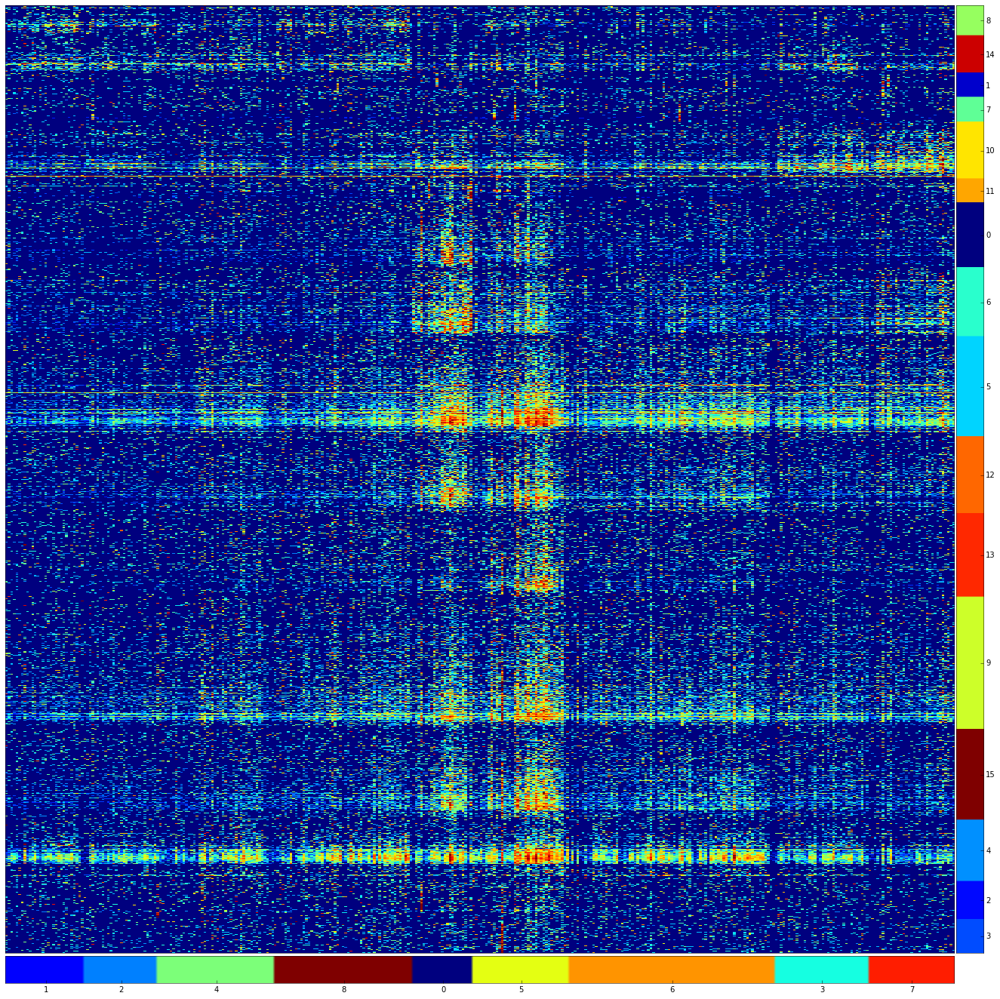

In [538]:
draw_heatmap(seq_sel_uHF, s_groups_uHF, g_groups_uHF)

## Combine the very similar Ptn+ basal populations (which only show minor differences in expession of Krt14, Krt5 and Defb6)

In [574]:
s_groups_uHF = AP_fuse_clusters(seq_sel_uHF_, s_groups_uHF, 0, [1,2,8], linkage = 'single')

## Prepare heatmap for visualization

In [582]:
#reorder cell groups

s_groups_uHF = AP_groups_reorder(s_groups_uHF, [6,2,3,1,5,4,0])

In [579]:
#select gene groups

g_groups_uHF = g_groups_uHF[g_groups_uHF.isin([5,10,14,8,9,0])]

In [580]:
#reorder gene groups

g_groups_uHF = AP_groups_reorder(g_groups_uHF, [5,10,14,8,9,0])

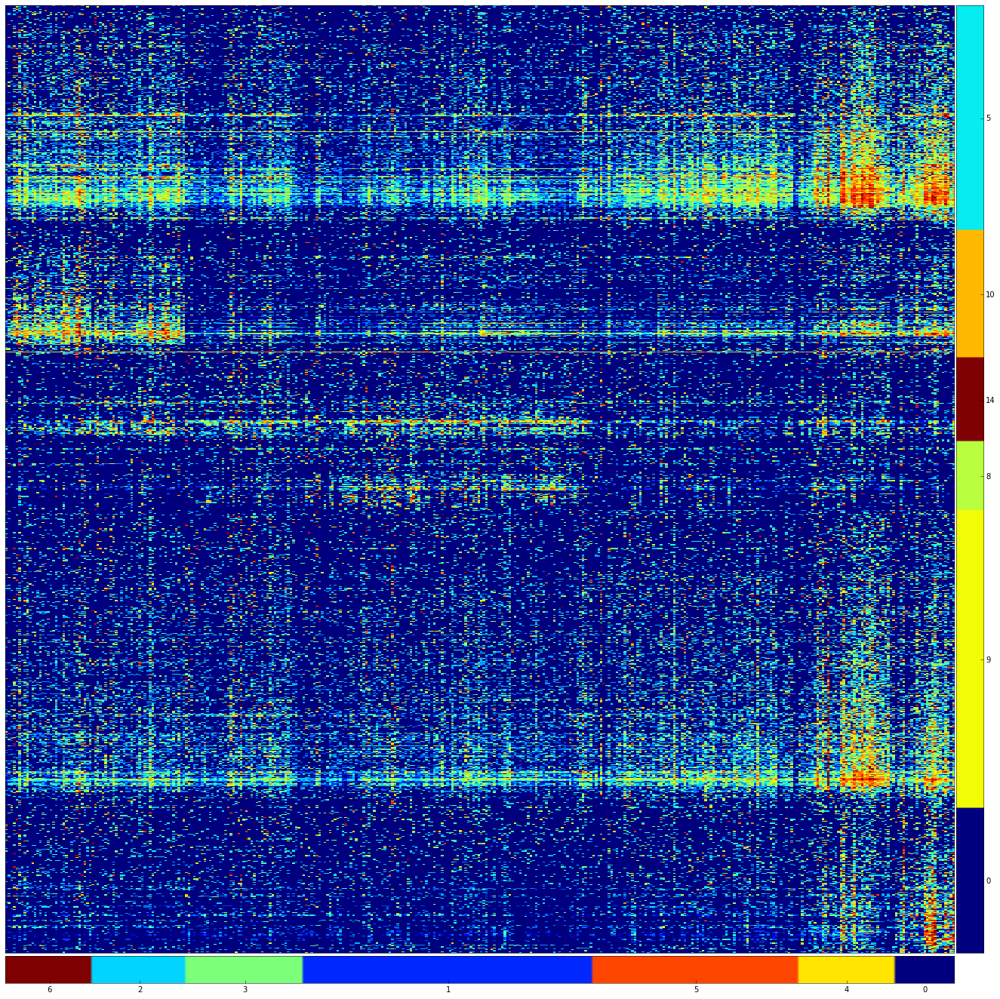

In [583]:
draw_heatmap(seq_sel_uHF, s_groups_uHF, g_groups_uHF)

## Checkpoint

In [584]:
#saveData_v1(s_groups_uHF, path_output, exp_id, 's_groups_uHF')
#saveData_v1(g_groups_uHF, path_output, exp_id, 'g_groups_uHF')

In [1349]:
s_groups_uHF = loadData_v1(path_output, exp_id, 's_groups_uHF', 'Series')
g_groups_uHF = loadData_v1(path_output, exp_id, 'g_groups_uHF', 'Series')

## Calculate robustness

In [586]:
robustness_uHF, robustness_uHF_null = robustness_AP_v1P(seq_sel_uHF_, 
                                                        s_groups_uHF, 
                                                        seq_sel_uHF_.index, 
                                                        0.75, 
                                                        100, 
                                                        -0.1, 
                                                        0.8, 
                                                        dview)

## Checkpoint

In [587]:
#saveData_v1(robustness_uHF, path_output, exp_id, 'robustness_uHF')
#saveData_v1(robustness_uHF_null, path_output, exp_id, 'robustness_uHF_null')

# Subcluster IFE basal cells

## Select features

In [589]:
seq = loadData_v1(path_input, exp_id, 'seq', 'DataFrame')

In [590]:
seq_IFE_b = seq[s_groups_1st[IFE_cells][s_groups_1st[IFE_cells]==2].index]

In [591]:
len(seq_IFE_b.columns)

322


Dropping spikes from dataset

Dropping repeats from dataset

Dropping unexpressed genes from dataset

After mean expression cutoff of 0.1, 6775 genes remain

After correlation cutoff of 5, 6775 genes remain

Optimization terminated successfully.
         Current function value: 1293.865497
         Iterations: 28
         Function evaluations: 53

After high variance feature selection, 2500 genes remain

Calculating binary logarithm of x + 1


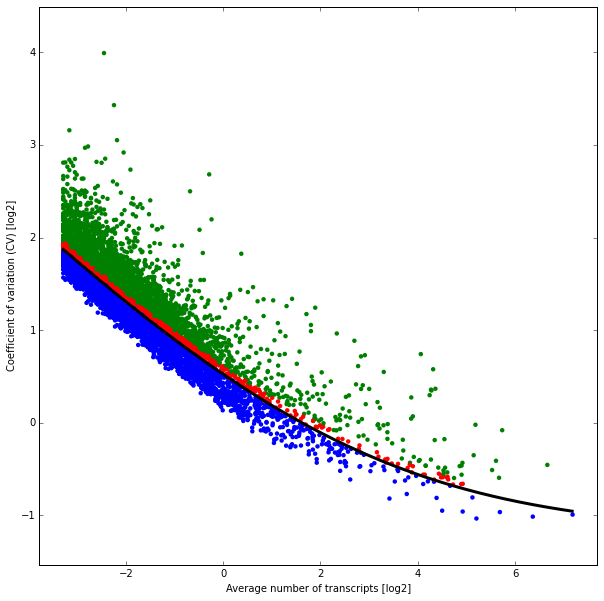

In [592]:
seq_sel_IFE_b = select_features_v1(seq_IFE_b, 0.10, 5, 2500, path_input, percentile=95, return_all=False)

## Remove genes which where identified as early immediate genes (#2) and housekeeping genes (#0) in the 1st lvl clustering, but include genes which have been defined as linked to the IFE basal cluster in 1st lvl clustering

In [593]:
genes_sel = list(set(seq_sel_IFE_b.index.difference(g_groups_1st[g_groups_1st.isin([2,0])].index)))
genes_sel = list(set(genes_sel + list(g_groups_1st[g_groups_1st==3].index)))

seq_sel_IFE_b = log2Transform(seq_IFE_b.ix[genes_sel])


Calculating binary logarithm of x + 1


In [594]:
len(seq_sel_IFE_b.index)

2260

## Checkpoint

In [595]:
saveData_v1(seq_sel_IFE_b, path_output, exp_id, 'seq_sel_IFE_b')

In [596]:
seq_sel_IFE_b = loadData_v1(path_output, exp_id, 'seq_sel_IFE_b', 'DataFrame')

## Cluster cells I

In [600]:
preference = np.arange(-2.0, 0.0, 0.1)
damping = np.arange(0.5, 1.0, 0.05)

In [601]:
affy_s_IFE_b = seq_sel_IFE_b.corr()
dist_s_IFE_b = 1 - affy_s_IFE_b

(          -2.0      -1.9      -1.8      -1.7      -1.6      -1.5      -1.4  \
 0.50 -292.1051 -291.9922 -291.9922 -291.9922 -291.9922 -291.9922 -291.9922   
 0.55 -291.9922 -291.9922 -291.9922 -291.9922 -291.9922 -291.9922 -291.9922   
 0.60 -292.1051 -292.1051 -291.9922 -291.9922 -291.9922 -291.9922 -288.6767   
 0.65 -292.1051 -292.1051 -291.9922 -291.9922 -291.9922 -288.6767 -288.6767   
 0.70 -292.1051 -288.6767 -288.6767 -291.9922 -291.9922 -291.9922 -291.9922   
 0.75 -291.9922 -291.9922 -291.9922 -291.9922 -291.9922 -291.9922 -291.9922   
 0.80 -291.9922 -291.9922 -291.9922 -291.9922 -288.6767 -288.6767 -288.6767   
 0.85 -288.6767 -288.6767 -288.6767 -288.6767 -288.6767 -288.6767 -288.6767   
 0.90 -288.6767 -288.6767 -288.6767 -288.6767 -288.6767 -288.6767 -288.6767   
 0.95 -288.6767 -288.6767 -288.6767 -288.6767 -288.6767 -288.6767 -288.6767   
 
           -1.3      -1.2      -1.1      -1.0      -0.9      -0.8      -0.7  \
 0.50 -288.6767 -288.6767 -288.6767 -288.6767 -288

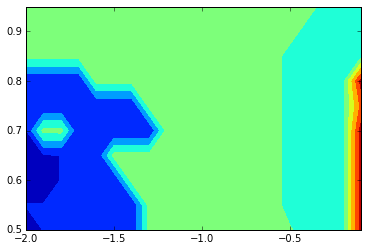

In [602]:
IC_s, Ng_s = AP_IC_v3P(seq_sel_IFE_b, affy_s_IFE_b, 0, 'precomputed', preference, damping, path_scripts, dview, linkage='single', criterion='BIC')
IC_s, Ng_s, plt.contourf(IC_s.columns, IC_s.index, IC_s)

In [603]:
pref_s, damp_s = AP_IC_findmin(IC_s)
print pref_s, damp_s

-2.0 0.6


In [604]:
s_groups_IFE_b = AP_clustering_v3P(seq_sel_IFE_b, affy_s_IFE_b, 0, 'precomputed', pref_s, damp_s, path_scripts, linkage = 'single')

In [605]:
len(set(s_groups_IFE_b))

2

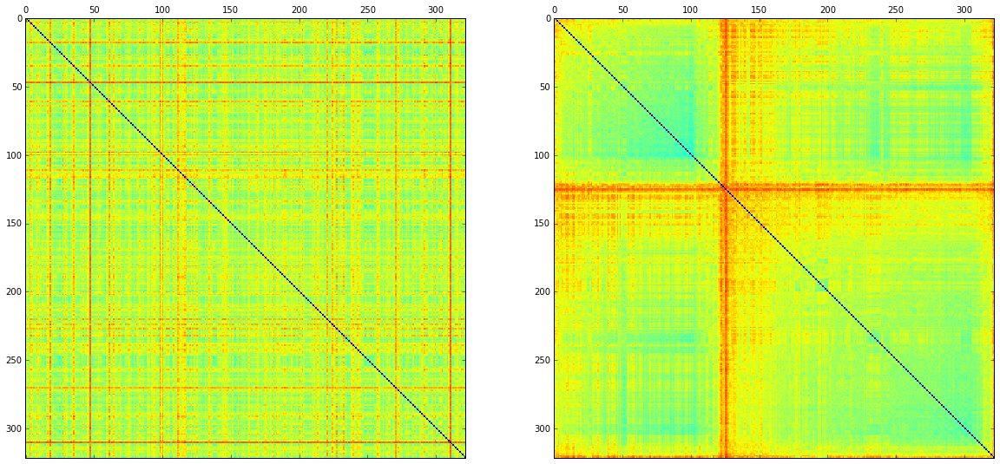

In [606]:
draw_AP_dist_mat(dist_s_IFE_b, s_groups_IFE_b)

## Cluster genes I

In [614]:
preference = np.arange(-6.0, -3.0, 0.1)
damping = np.arange(0.75, 0.9, 0.05)

In [615]:
affy_g_IFE_b = seq_sel_IFE_b.T.corr()
dist_g_IFE_b = 1 - affy_g_IFE_b

(          -6.0      -5.9      -5.8      -5.7      -5.6      -5.5      -5.4  \
 0.75  -1478.99 -1460.946 -1464.881 -1487.159 -1472.442  -1480.26 -1483.513   
 0.80 -1453.608 -1454.271 -1501.117 -1507.786 -1507.786 -1515.228 -1515.228   
 0.85 -1507.786 -1507.786 -1507.786 -1514.993 -1507.786 -1507.786 -1507.786   
 0.90 -1507.786 -1507.786 -1507.786 -1507.786 -1507.786 -1507.786 -1515.228   
 
           -5.3      -5.2      -5.1    ...         -4.0      -3.9      -3.8  \
 0.75  -1480.26 -1516.511  -1488.68    ...    -1560.634 -1560.634 -1560.634   
 0.80 -1515.228 -1515.228 -1513.494    ...    -1560.634 -1560.634 -1564.969   
 0.85 -1507.786 -1507.786 -1507.786    ...    -1564.969 -1564.969 -1564.969   
 0.90 -1515.228 -1515.228 -1521.706    ...    -1564.969 -1564.969 -1564.969   
 
           -3.7      -3.6      -3.5      -3.4      -3.3      -3.2      -3.1  
 0.75 -1554.919 -1554.919 -1536.967 -1554.673 -1554.673 -1554.673 -1552.117  
 0.80 -1564.969 -1552.196 -1554.919 -1564.559 -156

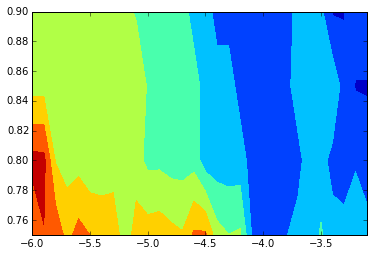

In [616]:
IC_g, Ng_g = AP_IC_v3P(seq_sel_IFE_b, affy_g_IFE_b, 1, 'precomputed', preference, damping, path_scripts, dview, linkage='single', criterion='BIC')
IC_g, Ng_g, plt.contourf(IC_g.columns, IC_g.index, IC_g)

In [617]:
pref_g, damp_g = AP_IC_findmin(IC_g)
print pref_g, damp_g

-3.4 0.9


In [618]:
g_groups_IFE_b = AP_clustering_v3P(seq_sel_IFE_b, affy_g_IFE_b, 1, 'precomputed', pref_g, damp_g, path_scripts, linkage = 'single')

In [619]:
len(set(g_groups_IFE_b))

20

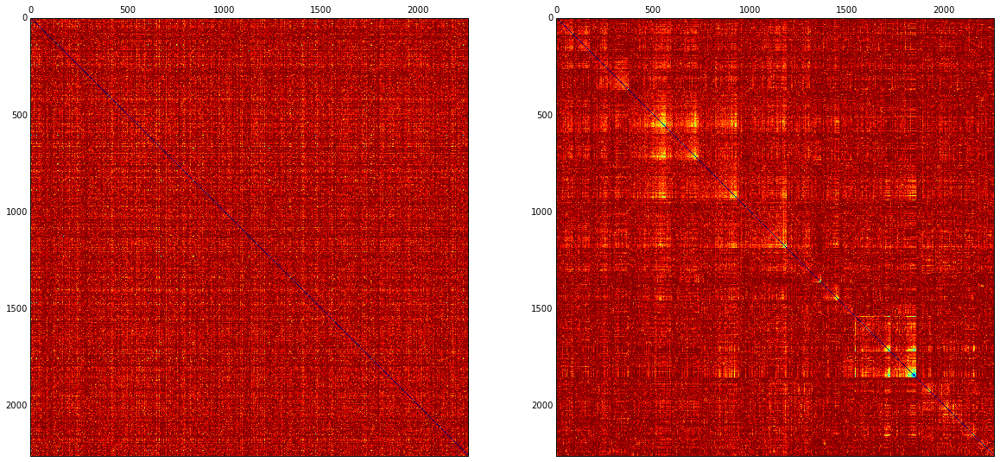

In [620]:
draw_AP_dist_mat(dist_g_IFE_b, g_groups_IFE_b)

## Draw heatmap

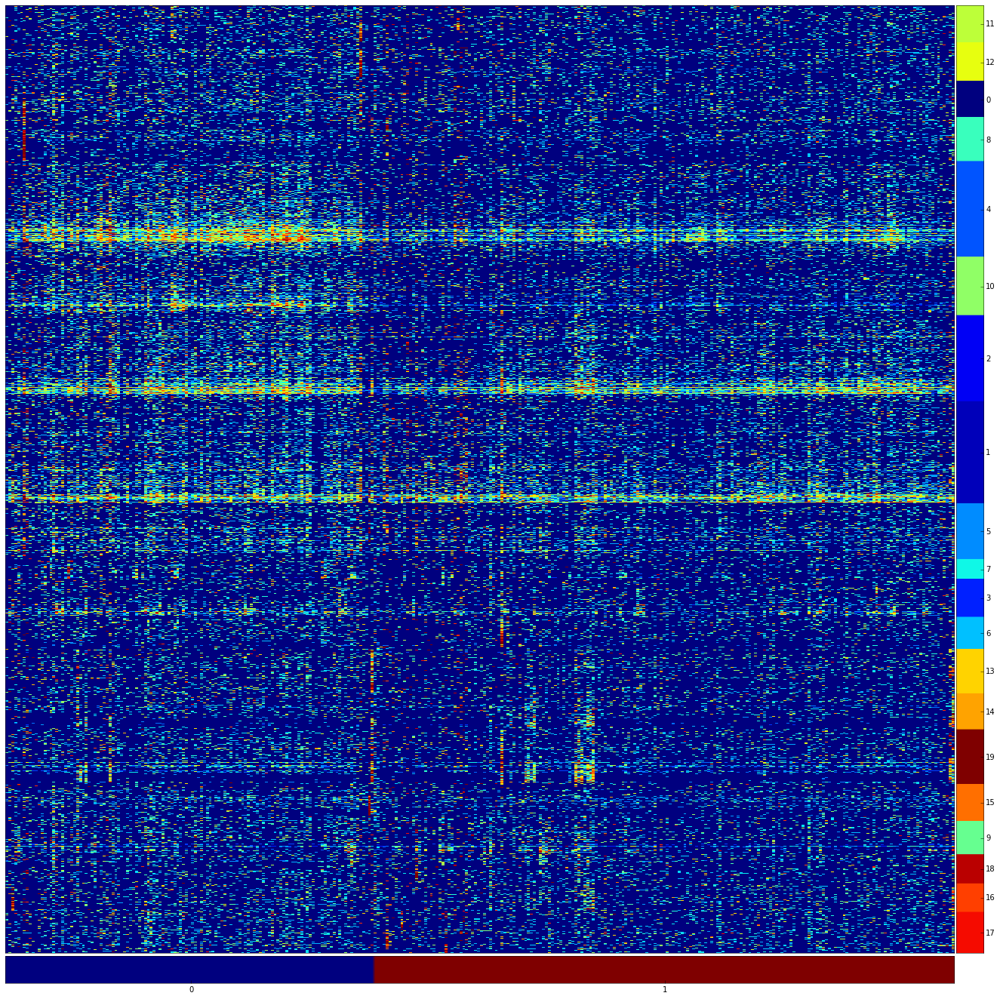

In [621]:
draw_heatmap(seq_sel_IFE_b, s_groups_IFE_b, g_groups_IFE_b)

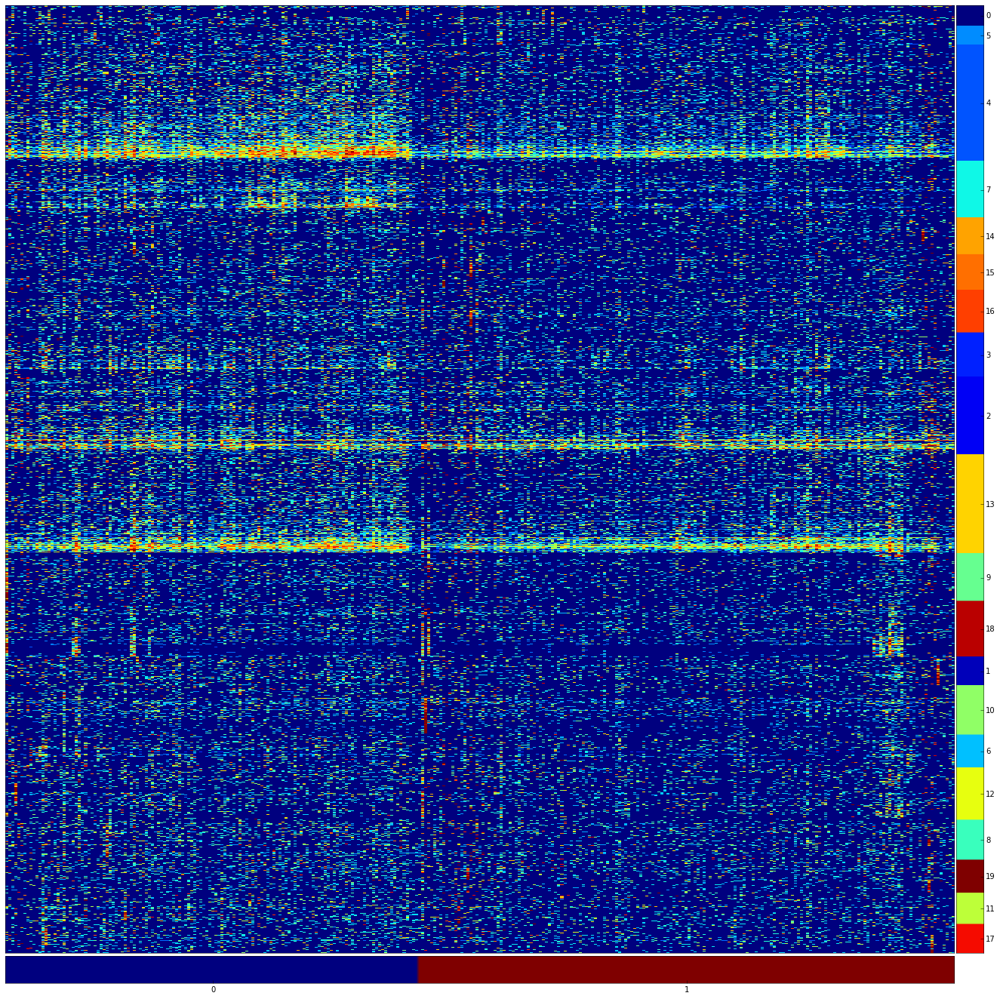

In [290]:
draw_heatmap(seq_sel_, s_groups_basal, g_groups_basal)

## Select potentially differentially expressed gene groups: #9 (Sostdc1, Aqp3, Postn, Krt17 cluster) and #3 (Thbs1 cluster). The more apparent hetereogenity linked to differential expression of differentiation-related clusters will be addressed later.

In [660]:
genes_sel = g_groups_IFE_b[g_groups_IFE_b.isin([3,9])].index

In [661]:
seq_sel_IFE_b_ = seq_sel_IFE_b.ix[genes_sel]

## Cluster cells with selected genes

In [672]:
preference = np.arange(-12.0, -10.0, 0.1)
damping = np.arange(0.7, 0.95, 0.05)

In [673]:
affy_s_IFE_b = seq_sel_IFE_b_.corr()
dist_s_IFE_b = 1 - affy_s_IFE_b

         -12.0     -11.9     -11.8     -11.7     -11.6     -11.5     -11.4  \
0.70 -302.6589 -302.6589 -303.1793 -302.6589 -302.6589 -303.1793 -303.1793   
0.75 -302.6589 -302.6589 -302.6589 -302.6589 -302.6589 -302.6589 -302.6589   
0.80 -303.1793 -303.1793 -303.1793 -303.1793 -303.1793 -303.1793 -303.1793   
0.85 -303.1793 -303.1793 -307.7677 -307.7677 -307.7677 -307.7677 -307.7677   
0.90 -303.1793 -303.1793 -303.1793 -303.1793 -303.1793 -303.1793 -303.1793   

         -11.3     -11.2     -11.1     -11.0     -10.9     -10.8     -10.7  \
0.70 -308.3977 -308.3977 -302.6589 -302.6589 -302.6589 -302.6589 -302.6589   
0.75 -302.6589 -302.6589 -302.6589 -302.6589 -302.6589 -302.6589 -302.6589   
0.80 -303.1793 -303.1793 -303.1793 -303.1793 -303.1793 -303.1793 -303.1793   
0.85 -307.7677 -307.7677 -307.7677 -307.7677 -303.5859 -303.5859 -303.5859   
0.90 -303.1793 -303.1793 -303.1793 -303.1793 -303.1793 -303.1793 -303.1793   

         -10.6     -10.5     -10.4     -10.3     -10.2     -10

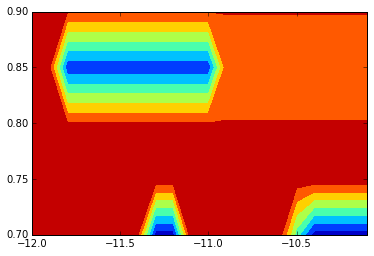

In [674]:
IC_s, Ng_s = AP_IC_v3P(seq_sel_IFE_b_, affy_s_IFE_b, 0, 'precomputed', preference, damping, path_scripts, dview, linkage='single', criterion='BIC')
print IC_s, Ng_s, plt.contourf(IC_s.columns, IC_s.index, IC_s)

In [675]:
pref_s, damp_s = AP_IC_findmin(IC_s)
print pref_s, damp_s

-10.4 0.7


In [714]:
s_groups_IFE_b = AP_clustering_v3P(seq_sel_IFE_b_, affy_s_IFE_b, 0, 'precomputed', -11.5, 0.85, path_scripts, linkage = 'single')

In [692]:
len(set(s_groups_IFE_b))

3

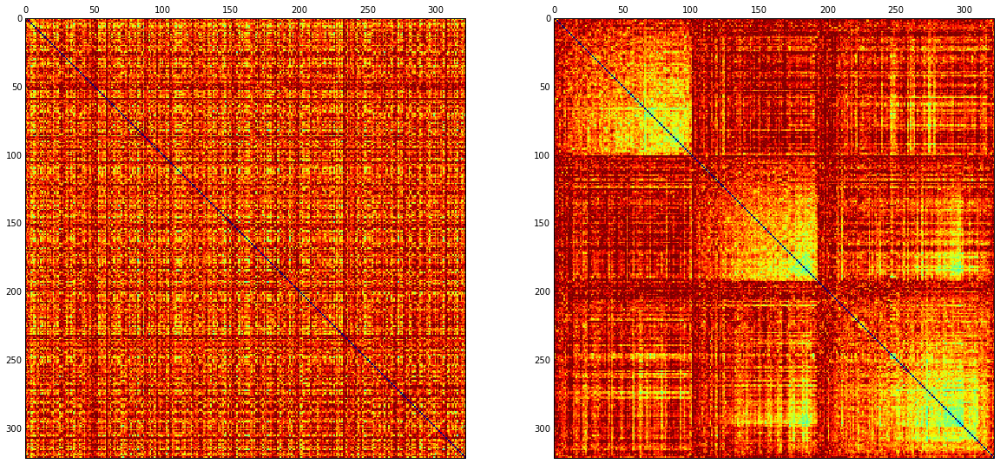

In [693]:
draw_AP_dist_mat(dist_s_IFE_b, s_groups_IFE_b)

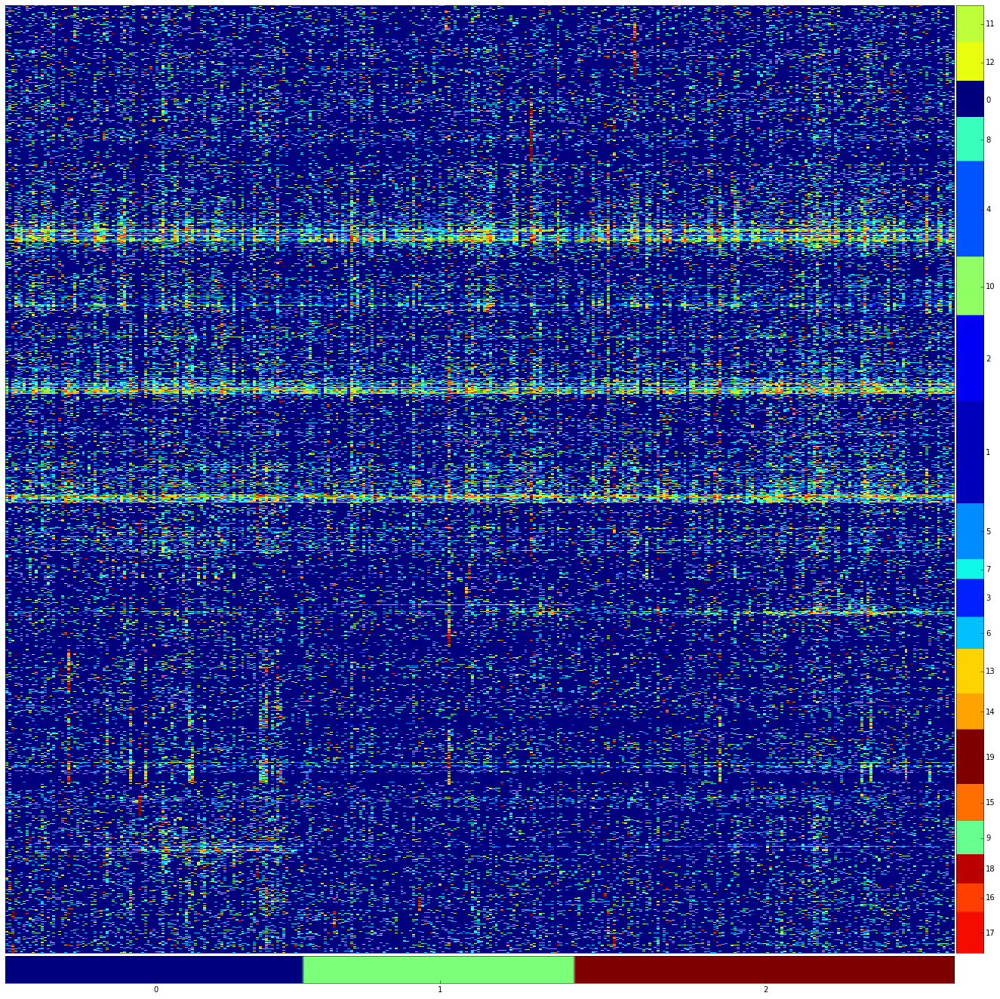

In [695]:
draw_heatmap(seq_sel_IFE_b, s_groups_IFE_b, g_groups_IFE_b)

## To achieve better resolution of the Sostdc1(hi) and Thbs1(hi) population, transfer cells manually to other cluster

In [715]:
s_groups_IFE_b[s_groups_IFE_b[s_groups_IFE_b==0].index[:7]] = 1
s_groups_IFE_b[s_groups_IFE_b[s_groups_IFE_b==2].index[:35]] = 1

In [719]:
s_groups_IFE_b = AP_fuse_clusters(seq_sel_IFE_b_, s_groups_IFE_b, 0, [0], linkage='single')
s_groups_IFE_b = AP_fuse_clusters(seq_sel_IFE_b_, s_groups_IFE_b, 0, [1], linkage='single')
s_groups_IFE_b = AP_fuse_clusters(seq_sel_IFE_b_, s_groups_IFE_b, 0, [2], linkage='single')

In [724]:
g_groups_IFE_b.ix['Cdk1']

19

## For better visualization, select gene groups

In [725]:
g_groups_IFE_b = g_groups_IFE_b[g_groups_IFE_b.isin([1,2,4,19,14,3,9])]

In [726]:
g_groups_IFE_b[g_groups_IFE_b==2] = 1
g_groups_IFE_b[g_groups_IFE_b==19] = 14

In [727]:
#fuse basal marker groups and cell cycle groups

g_groups_IFE_b = AP_fuse_clusters(seq_sel_IFE_b, g_groups_IFE_b, 1, [1], linkage='single')
g_groups_IFE_b = AP_fuse_clusters(seq_sel_IFE_b, g_groups_IFE_b, 1, [1], linkage='single')

In [731]:
s_groups_IFE_b = AP_groups_reorder(s_groups_IFE_b, [2,1,0])

In [729]:
g_groups_IFE_b = AP_groups_reorder(g_groups_IFE_b, [1,14,4,3,9])

In [733]:
s_groups_IFE_b = AP_invert_index(s_groups_IFE_b, 2)
s_groups_IFE_b = AP_invert_index(s_groups_IFE_b, 1)

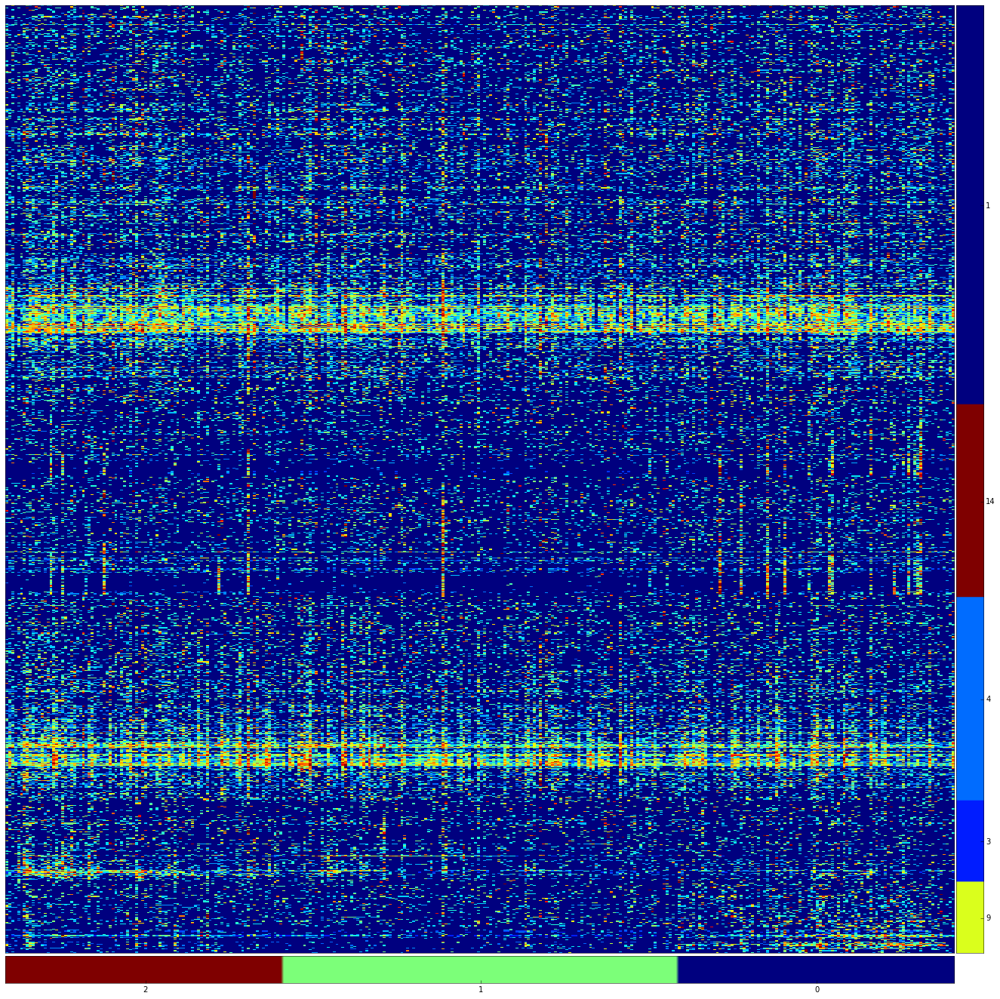

In [734]:
draw_heatmap(seq_sel_IFE_b, s_groups_IFE_b, g_groups_IFE_b)

In [ ]:
draw_barplots(seq, s_groups_IFE_b, ['Krt14','Thbs1','Sostdc1','Krt10','Cd24a'])

## Checkpoint

In [735]:
#saveData_v1(s_groups_IFE_b, path_output, exp_id, 's_groups_IFE_b')
#saveData_v1(g_groups_IFE_b, path_output, exp_id, 'g_groups_IFE_b')

In [40]:
s_groups_IFE_b = loadData_v1(path_output, exp_id, 's_groups_IFE_b', 'Series')
g_groups_IFE_b = loadData_v1(path_output, exp_id, 'g_groups_IFE_b', 'Series')

## Calculate robustness

In [738]:
robustness_IFE_b, robustness_IFE_b_null = robustness_AP_v1P(seq_sel_IFE_b_, 
                                                        s_groups_IFE_b, 
                                                        seq_sel_IFE_b_.index, 
                                                        0.75, 
                                                        100, 
                                                        -11.5,
                                                        0.85, 
                                                        dview)

## Checkpoint

In [739]:
saveData_v1(robustness_IFE_b, path_output, exp_id, 'robustness_IFE_b')
saveData_v1(robustness_IFE_b_null, path_output, exp_id, 'robustness_IFE_b_null')

# 2nd level clustering - negative binominal regression

## Combine sublcusters into a single group file

In [746]:
s_groups_2nd = pd.Series(index = s_groups_1st.index)

#0. IFE basal Thbs(hi)
s_groups_2nd[s_groups_IFE_b[s_groups_IFE_b==2].index] = 0

#1. IFE basal Thbs(lo),Sostdc1(lo)
s_groups_2nd[s_groups_IFE_b[s_groups_IFE_b==1].index] = 1

#2. IFE basal Sostdc1(hi)
s_groups_2nd[s_groups_IFE_b[s_groups_IFE_b==0].index] = 2

#3. IFE differentiated I
s_groups_2nd[s_groups_1st[IFE_cells][s_groups_1st[IFE_cells]==1].index] = 3

#4. IFE differentiated II
s_groups_2nd[s_groups_1st[IFE_cells][s_groups_1st[IFE_cells]==8].index] = 4

#5. IFE keratinized I
s_groups_2nd[s_groups_1st[IFE_cells][s_groups_1st[IFE_cells]==0].index] = 5

#6. IFE keratinized II
s_groups_2nd[s_groups_1st[IFE_cells][s_groups_1st[IFE_cells]==10].index] = 6

#7. uHF 1 (Defb6/Cst6(hi), Krt14(-))
s_groups_2nd[s_groups_uHF[s_groups_uHF==6].index] = 7

#8. uHF 2 (Defb6/Cst6(hi), Krt14(hi))
s_groups_2nd[s_groups_uHF[s_groups_uHF==2].index] = 8

#9. uHF 3 (Defb6/Cst6(lo), Krt14(hi), Krt5/Ptn(lo))
s_groups_2nd[s_groups_uHF[s_groups_uHF==3].index] = 9

#10. uHF 4 (Defb6/Cst6(lo), Krt14(hi), Krt5/Ptn(hi))
s_groups_2nd[s_groups_uHF[s_groups_uHF==1].index] = 10

#11. uHF 5 (Defb6/Cst6(lo), Krt14(dim), Krt10(dim))
s_groups_2nd[s_groups_uHF[s_groups_uHF==5].index] = 11

#12. uHF 6 (Defb6/Cst6(lo), Krt14(lo), Krt10(hi))
s_groups_2nd[s_groups_uHF[s_groups_uHF==4].index] = 12

#13. uHF 7 (Defb6/Cst6(lo), Krt14(lo), Krt10(lo), Lor(hi))
s_groups_2nd[s_groups_uHF[s_groups_uHF==0].index] = 13

#14. Sebaceous gland
s_groups_2nd[s_groups_1st[s_groups_1st==5].index] = 14

#15. Outer bulge 1 (Lgr5(+), Cd34(+))
s_groups_2nd[s_groups_OB[s_groups_OB==1].index] = 15

#16. Outer bulge 2 (Lgr5(-), Cd34(+))
s_groups_2nd[s_groups_OB[s_groups_OB==0].index] = 16

#17. Outer bulge 3 (Aspn(+))
s_groups_2nd[s_groups_OB[s_groups_OB==4].index] = 17

#18. Outer bulge 4 (Postn(+), Cd34(+), Krt79(+))
s_groups_2nd[s_groups_OB[s_groups_OB==3].index] = 18

#19. Outer bulge 5 (Postn(+), Cd34(+), Krt10(+))
s_groups_2nd[s_groups_OB[s_groups_OB==2].index] = 19

#20. Inner bulge 1 (Krt6a(+))
s_groups_2nd[s_groups_IB[s_groups_IB==2].index] = 20

#21. Inner bulge 2 (Krt6a(+), Postn(+))
s_groups_2nd[s_groups_IB[s_groups_IB==1].index] = 21

#22. Inner bulge 3 (Krt6a(+), Krt10(+))
s_groups_2nd[s_groups_IB[s_groups_IB==0].index] = 22

#23. T-cells
s_groups_2nd[s_groups_1st[s_groups_1st==11].index] = 23

#24. Langerhans cells
s_groups_2nd[s_groups_1st[s_groups_1st==12].index] = 24

In [749]:
#reorder

s_groups_2nd = AP_groups_reorder(s_groups_2nd, range(25))

## Checkpoint

In [752]:
saveData_v1(s_groups_2nd, path_output, exp_id, 's_groups_2nd')

## Define gene list to be used as input

In [13]:
seq = loadData_v1(path_input, exp_id, 'seq', 'DataFrame')
s_groups_2nd = loadData_v1(path_output, exp_id, 's_groups_2nd', 'Series')

In [754]:
seq_ = dropNull(seq[s_groups_2nd.index], path_input, cutoff_mean = 0.00)


Dropping spikes from dataset

Dropping repeats from dataset

Dropping unexpressed genes from dataset


In [755]:
genes_sel_NBR_2nd = NBR_select_genes_mean(seq_, s_groups_2nd, cutoff = 0.25)

In [756]:
len(genes_sel_NBR_2nd)

9784

## Fit model

In [761]:
"""
NBR_2nd_traces = neg_binom_regression_v2P(seq_, 
                                          s_groups_2nd, 
                                          genes_sel_NBR_2nd, 
                                          path_output, 
                                          exp_id, 
                                          'NBR_2nd_traces', 
                                          10000, 
                                          dview, 
                                          iter=275, 
                                          chains=4, 
                                          warmup=25,
                                          n_jobs=4)
"""

0 / 9784
9784 / 9784


In [36]:
def neg_binom_vs_zero_v1P(summary, dview, PP='99.9', zero = 1.05):
    
    """
    For each group, tests the posterior probability of 'beta' against zero and determines that a gene is additionally 
    expressed in a group if 'beta' exceeds zero with a posterior probability of either 99.9% or 95%. For each active gene,
    returns different measures of the effect size - i.e. the number of molecules additionally expressed within a group.
    ----------
    summary: DataFrame with summary data of the negative binominal regression traces.
    dview: name of Ipython DirectView Instance for parallel computing.
    PP: posterior probability cutoff. '99.9' or '95'. Default: '99.9'
    zero: absolute zero value. Default: 1.05.
    ----------
    returns 'bin' - a DataFrame indicating whether genes are considered 'on'/1 or 'off' in a population - and 'size' -
    a DataFrame with three measures of effect sizes.
    """
    ##########################################################
        
    def neg_binom_test_vs_zero(gene, summary, PP, zero):
        
        """
        Helper function for neg_binom_test_vs_zero_v1P.
        """
        
        #define output files
        
        bin_tmp = pd.DataFrame(index = [gene], columns = summary.columns)
        
        multi_ix = [np.array([gene,gene,gene,gene,gene]),
                    np.array(['mean','median','min','percentile - 25','percentile - 5'])]
        
        size_tmp = pd.DataFrame(index = multi_ix, columns = summary.columns)
        
        #iterate through groups and score
        
        for gr in summary.columns:
            
            if PP == '99.9':
            
                if summary.ix['min', gr] > zero:
                
                    bin_tmp.ix[gene, gr] = 1
                                                                        
                    size_tmp.ix[gene, 'mean'][gr] = summary.ix['mean', gr] - zero
                    size_tmp.ix[gene, 'median'][gr] = summary.ix['median', gr] - zero
                    size_tmp.ix[gene, 'percentile - 25'][gr] = summary.ix['Q25', gr] - zero
                    size_tmp.ix[gene, 'percentile - 5'][gr] = summary.ix['Q5', gr] - zero
                    size_tmp.ix[gene, 'min'][gr] = summary.ix['min', gr] - zero
                
                else:
                
                    bin_tmp.ix[gene, gr] = 0
                
                    size_tmp.ix[gene, 'mean'][gr] = 'n.s'
                    size_tmp.ix[gene, 'median'][gr] = 'n.s'
                    size_tmp.ix[gene, 'percentile - 25'][gr] = 'n.s'
                    size_tmp.ix[gene, 'percentile - 5'][gr] = 'n.s'
                    size_tmp.ix[gene, 'min'][gr] = 'n.s'
                    
            elif PP == '95':
                
                if summary.ix['Q5', gr] > zero:
                    
                    bin_tmp.ix[gene, gr] = 1
                    
                    size_tmp.ix[gene, 'mean'][gr] = summary.ix['mean', gr] - zero
                    size_tmp.ix[gene, 'median'][gr] = summary.ix['median', gr] - zero
                    size_tmp.ix[gene, 'percentile - 25'][gr] = summary.ix['Q25', gr] - zero
                    size_tmp.ix[gene, 'percentile - 5'][gr] = summary.ix['Q5', gr] - zero
                    size_tmp.ix[gene, 'min'][gr] = summary.ix['min', gr] - zero
                
                else:
                
                    bin_tmp.ix[gene, gr] = 0
                
                    size_tmp.ix[gene, 'mean'][gr] = 'n.s'
                    size_tmp.ix[gene, 'median'][gr] = 'n.s'
                    size_tmp.ix[gene, 'percentile - 25'][gr] = 'n.s'
                    size_tmp.ix[gene, 'percentile - 5'][gr] = 'n.s'
                    size_tmp.ix[gene, 'min'][gr] = 'n.s'
                    
                
        return bin_tmp, size_tmp
    
    ##########################################################
    
    #perform test against zero in parallel
    
    output_tmp = dview.map_sync(neg_binom_test_vs_zero,
                                [gene for gene in summary.index.levels[0]],
                                [summary.ix[gene] for gene in summary.index.levels[0]],
                                [PP for gene in summary.index.levels[0]],
                                [zero for gene in summary.index.levels[0]])
    
    #fuse data and return
        
    bin_ = pd.concat([x[0] for x in output_tmp], axis = 0)
    size = pd.concat([x[1] for x in output_tmp], axis = 0)
    
    return bin_, size

In [772]:
NBR_2nd_summary = neg_binom_summary_stats_v1P(NBR_2nd_traces, dview)

In [37]:
NBR_2nd_bin_zero, NBR_2nd_size_zero = neg_binom_vs_zero_v1P(NBR_2nd_summary, dview, PP='95', zero=1.1)

In [773]:
NBR_2nd_bin_bl, NBR_2nd_size_bl = neg_binom_vs_baseline_v1P(NBR_2nd_summary, dview, PP='95')

In [774]:
NBR_2nd_bin_gr, NBR_2nd_size_gr = neg_binom_vs_groups_v1P(NBR_2nd_summary, dview, PP = '95')

In [39]:
#saveData_to_pickle_v1(NBR_2nd_summary, path_output, exp_id,'NBR_2nd_summary')
#saveData_to_pickle_v1(NBR_2nd_bin_zero,path_output,exp_id,'NBR_2nd_bin_zero')
#saveData_to_pickle_v1(NBR_2nd_size_zero,path_output,exp_id,'NBR_2nd_size_zero')
#saveData_to_pickle_v1(NBR_2nd_bin_bl,path_output,exp_id,'NBR_2nd_bin_bl')
#saveData_to_pickle_v1(NBR_2nd_size_bl,path_output,exp_id,'NBR_2nd_size_bl')
#saveData_to_pickle_v1(NBR_2nd_bin_gr,path_output,exp_id,'NBR_2nd_bin_gr')
#saveData_to_pickle_v1(NBR_2nd_size_gr,path_output,exp_id,'NBR_2nd_size_gr')